In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

# === PARAMETERS ===
FICHIER_CSV = "all_data_enriched.csv"
MAX_POINTS = 1000

# === LOAD DATA ===
df = pd.read_csv(FICHIER_CSV, low_memory=False)

def plot(df, rider_name):
    # Filter the df to include only the specified rider
    rider_data = df[df['rider_name'] == rider_name]
    
    if rider_data.empty:
        print(f"No data found for rider: {rider_name}")
        return

    # Loop through all unique runs for the rider
    for run_name in rider_data['run'].unique():
        run_data = rider_data[rider_data['run'] == run_name]

        # Print the summary at the beginning before plotting
        print(f"Summary for {rider_name} - Run: {run_name}")

        # Loop through all unique maneuvers for the current run
        for maneuver_index in run_data['maneuver_index'].unique():
            maneuver_data = run_data[run_data['maneuver_index'] == maneuver_index]

            # Extract necessary maneuver details from df
            maneuver_time = maneuver_data['ISODateTimeUTC'].iloc[0]  # Assuming this is the maneuver time
            maneuver_type = maneuver_data['maneuver_type'].iloc[0]  # Assuming the maneuver type column exists in df
            duration = maneuver_data['interval_duration'].iloc[0]  # Duration of the maneuver
            start_time = maneuver_data['start_time'].iloc[0]
            end_time = maneuver_data['end_time'].iloc[0]
            boat_name = maneuver_data['boat_name'].iloc[0]
            # Convert start and end times to datetime for better readability

            # Print maneuver details
            print(f"\nManeuver details for Maneuver Index: {maneuver_index}")
            print(f"  Maneuver Time: {maneuver_time}")
            print(f"  Maneuver Type: {maneuver_type}")
            print(f"  Duration: {duration} seconds")
            print(f"  Start Time: {start_time}")
            print(f"  End Time: {end_time}")
            print(f"  boat_name: {boat_name}")
            print("\n\n")
            print(f"avg TWS: {maneuver_data['TWS'].mean():.2f} knots")
            print(f"avg TWA: {maneuver_data['TWA'].mean():.2f} degrees")
            print(f"avg TWD: {maneuver_data['TWD'].mean():.2f} degrees")

            # Prepare the plot
            fig, axes = plt.subplots(3, 5, figsize=(20, 12))
            fig.suptitle(f'{rider_name} - Run: {run_name} - Maneuver ID: {maneuver_index} - Maneuver type: {maneuver_type}', fontsize=16)

            # Plot Lat/Lon (Position)
            axes[0, 0].plot(maneuver_data['Lon'], maneuver_data['Lat'], label='Position', color='blue')
            axes[0, 0].set_title("Lat (y) / Lon (x)")
            axes[0, 0].set_xlabel("Longitude")
            axes[0, 0].set_ylabel("Latitude")

            # Plot Speed Over Ground (SOG)
            axes[0, 1].plot(maneuver_data['SecondsSince1970'], maneuver_data['SOG'], label='SOG', color='green')
            axes[0, 1].set_title("Speed Over Ground (SOG)")
            axes[0, 1].set_xlabel("Time")
            axes[0, 1].set_ylabel("SOG (knots)")
            axes[0, 1].tick_params(axis='x', rotation=45)

            # Plot Course Over Ground (COG)
            axes[0, 2].plot(maneuver_data['SecondsSince1970'], maneuver_data['COG'], label='COG', color='orange')
            axes[0, 2].set_title("Course Over Ground (COG)")
            axes[0, 2].set_xlabel("Time")
            axes[0, 2].set_ylabel("COG (degrees)")
            axes[0, 2].tick_params(axis='x', rotation=45)

            # Plot Heel angle
            axes[0, 3].plot(maneuver_data['SecondsSince1970'], maneuver_data['Heel'], label='Heel', color='red')
            axes[0, 3].set_title("Heel Angle")
            axes[0, 3].set_xlabel("Time")
            axes[0, 3].set_ylabel("Heel (degrees)")
            axes[0, 3].tick_params(axis='x', rotation=45)
            
            # Plot Trim
            axes[0, 4].plot(maneuver_data['SecondsSince1970'], maneuver_data['Trim'], label='Trim', color='red')
            axes[0, 4].set_title("Trim Angle")
            axes[0, 4].set_xlabel("Time")
            axes[0, 4].set_ylabel("Trim (degrees)")
            axes[0, 4].tick_params(axis='x', rotation=45)

            # Plot Side_lines2
            axes[1, 0].plot(maneuver_data['SecondsSince1970'], maneuver_data['side_line2'], label='Side_lines2', color='cyan')
            axes[1, 0].set_title("Side_lines2")
            axes[1, 0].set_xlabel("Time")
            axes[1, 0].set_ylabel("Side_lines2 (units)")
            axes[1, 0].tick_params(axis='x', rotation=45)

            # Plot Line_C2
            axes[1, 1].plot(maneuver_data['SecondsSince1970'], maneuver_data['Line_C2'], label='Line_C2', color='blue')
            axes[1, 1].set_title("Central Line")
            axes[1, 1].set_xlabel("Time")
            axes[1, 1].set_ylabel("Force (N)")
            axes[1, 1].tick_params(axis='x', rotation=45)

            # Plot ROT (Rate of Turn)
            axes[1, 2].plot(maneuver_data['SecondsSince1970'], maneuver_data['ROT'], label='ROT', color='gray')
            axes[1, 2].set_title("Rate of Turn (ROT)")
            axes[1, 2].set_xlabel("Time")
            axes[1, 2].set_ylabel("ROT (degrees/s)")
            axes[1, 2].tick_params(axis='x', rotation=45)

            if (maneuver_data['boat_name'] == "SenseBoard").all():
                # Plot F_back (Back Force)
                axes[1, 3].plot(maneuver_data['SecondsSince1970'], maneuver_data['F_back'], label='F_back', color='blue')
                axes[1, 3].set_title("Back Force (F_back)")
                axes[1, 3].set_xlabel("Time")
                axes[1, 3].set_ylabel("Force (N)")
                axes[1, 3].tick_params(axis='x', rotation=45)

                # Plot F_front (Front Force)
                axes[1, 4].plot(maneuver_data['SecondsSince1970'], maneuver_data['F_front'], label='F_front', color='green')
                axes[1, 4].set_title("Front Force (F_front)")
                axes[1, 4].set_xlabel("Time")
                axes[1, 4].set_ylabel("Force (N)")
                axes[1, 4].tick_params(axis='x', rotation=45)

            # Hide empty subplots in the last row
            axes[2, 0].axis('off')
            axes[2, 1].axis('off')
            axes[2, 2].axis('off')
            axes[2, 3].axis('off')
            axes[2, 4].axis('off')

            # Adjust layout and show plot
            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show()


### Maneuvers of Karl: 

Summary for Karl - Run: 08_06_Run1

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 07:48:52.359000+00:00
  Maneuver Type: Jibe
  Duration: 14.098000049591064 seconds
  Start Time: 1749368932.359
  End Time: 1749368946.457
  boat_name: Karl Maeder



avg TWS: 8.61 knots
avg TWA: -42.58 degrees
avg TWD: 289.87 degrees


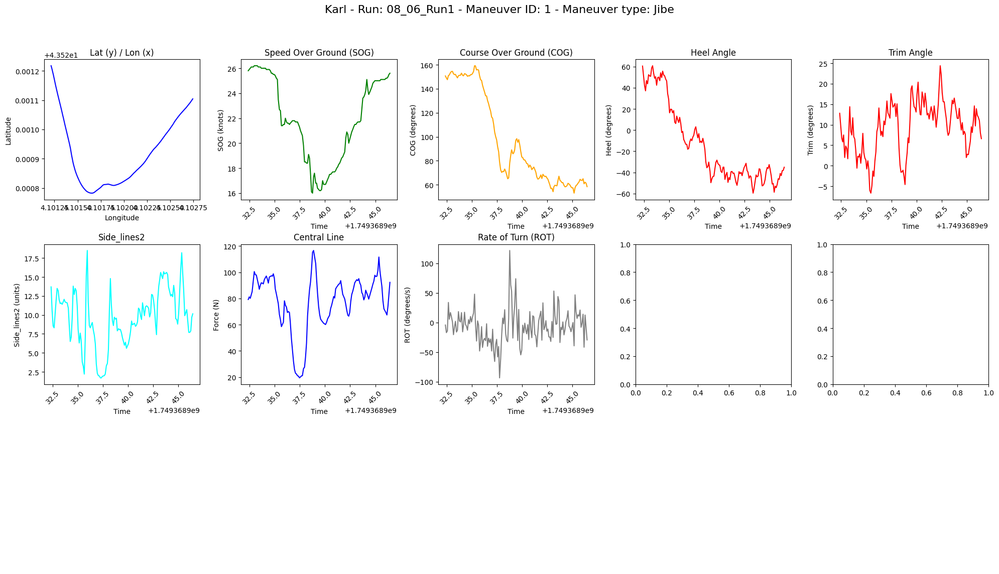


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 07:49:07.062000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749368947.062
  End Time: 1749368961.062
  boat_name: Karl Maeder



avg TWS: 9.58 knots
avg TWA: 28.96 degrees
avg TWD: 292.13 degrees


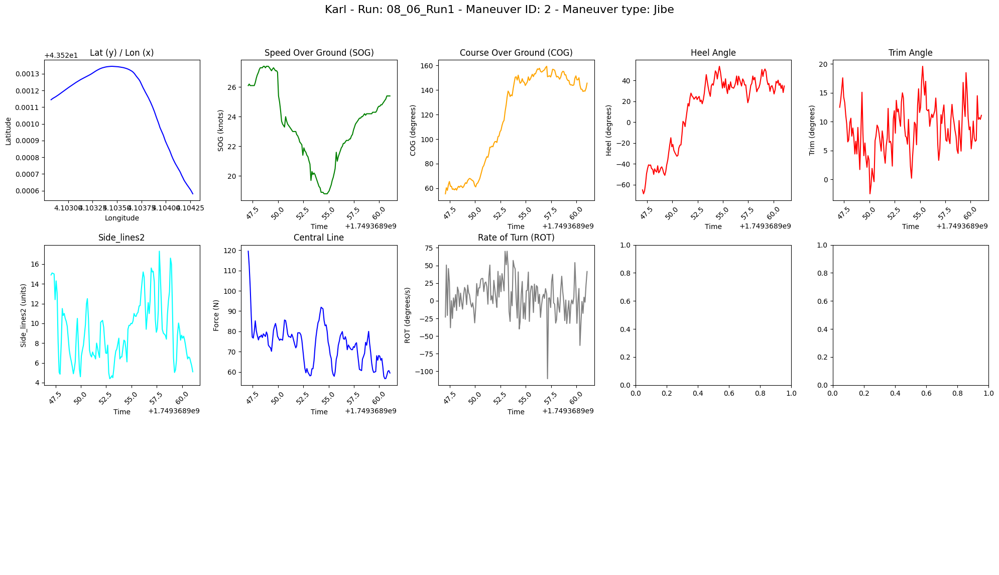


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 07:49:19.260000+00:00
  Maneuver Type: Jibe
  Duration: 14.002000093460085 seconds
  Start Time: 1749368959.26
  End Time: 1749368973.262
  boat_name: Karl Maeder



avg TWS: 10.15 knots
avg TWA: -45.36 degrees
avg TWD: 294.52 degrees


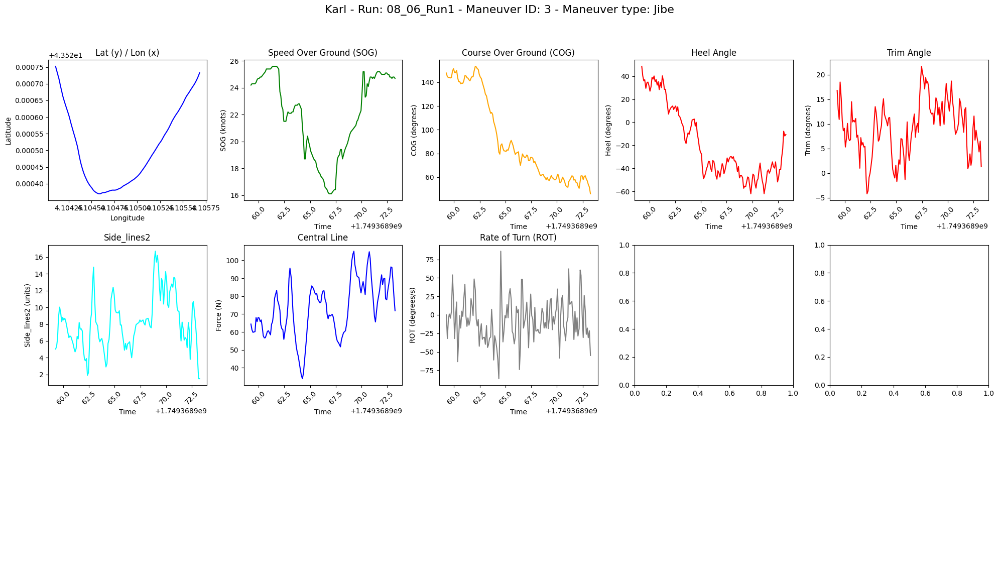


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 07:51:44.559000+00:00
  Maneuver Type: Jibe
  Duration: 14.002000093460085 seconds
  Start Time: 1749369104.559
  End Time: 1749369118.561
  boat_name: Karl Maeder



avg TWS: 10.23 knots
avg TWA: -34.04 degrees
avg TWD: 299.93 degrees


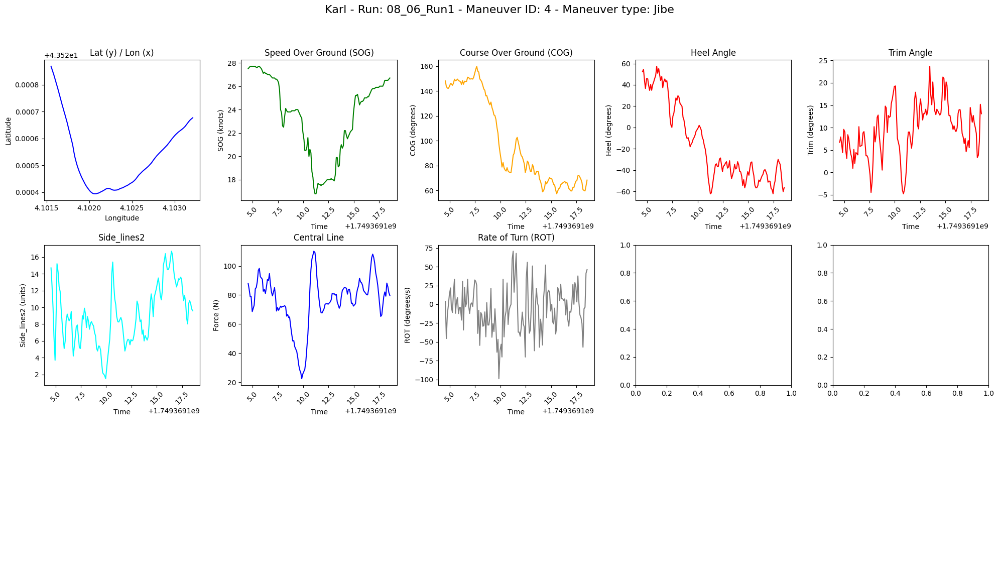


Maneuver details for Maneuver Index: 5
  Maneuver Time: 2025-06-08 07:52:10.960000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749369130.96
  End Time: 1749369144.96
  boat_name: Karl Maeder



avg TWS: 9.85 knots
avg TWA: -53.26 degrees
avg TWD: 298.89 degrees


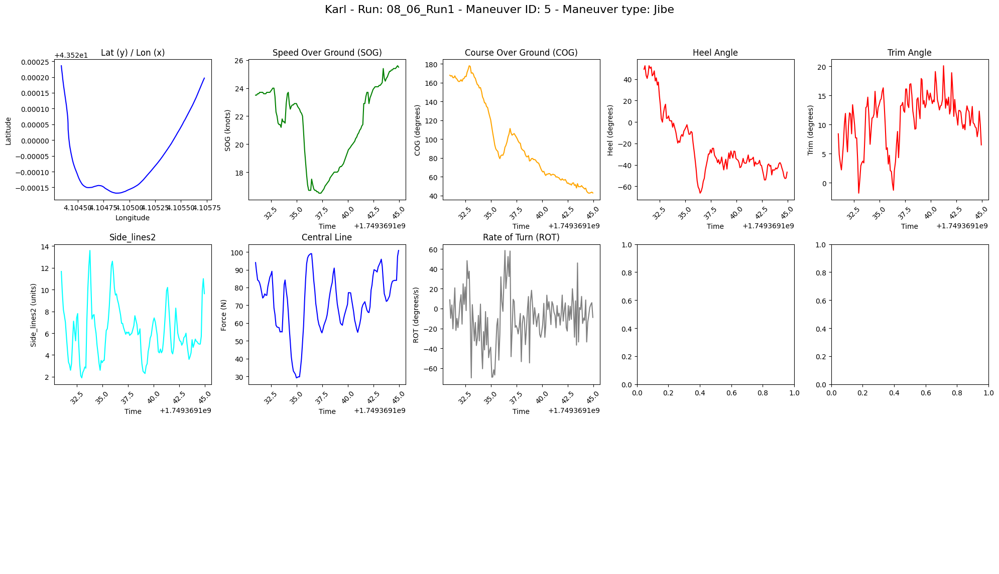

Summary for Karl - Run: 08_06_Run2

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:02:44.959000+00:00
  Maneuver Type: Jibe
  Duration: 14.000999927520752 seconds
  Start Time: 1749369764.959
  End Time: 1749369778.96
  boat_name: Karl Maeder



avg TWS: 8.19 knots
avg TWA: -37.73 degrees
avg TWD: 291.09 degrees


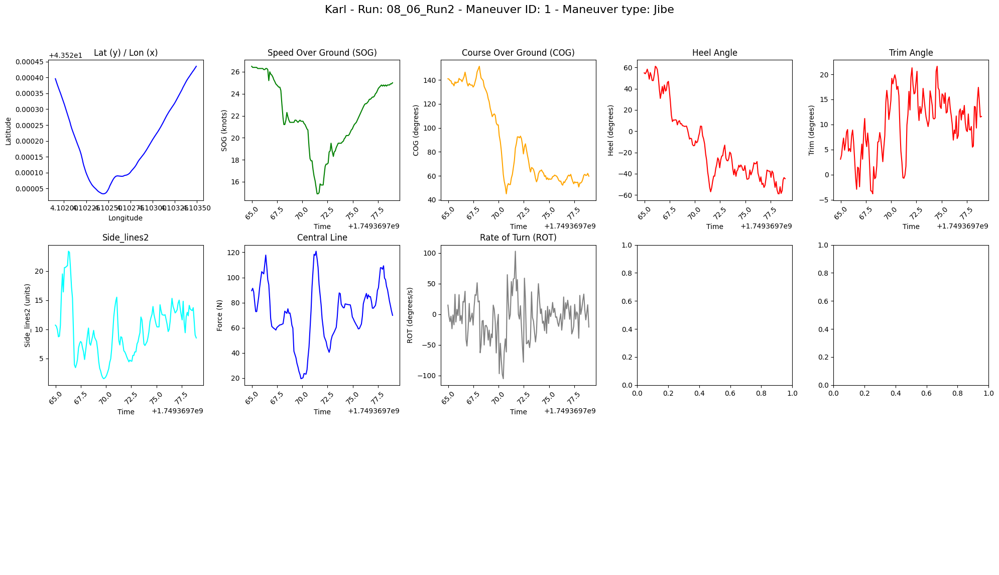


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:05:25.262000+00:00
  Maneuver Type: Jibe
  Duration: 13.997999906539915 seconds
  Start Time: 1749369925.262
  End Time: 1749369939.26
  boat_name: Karl Maeder



avg TWS: 9.92 knots
avg TWA: 57.86 degrees
avg TWD: 279.50 degrees


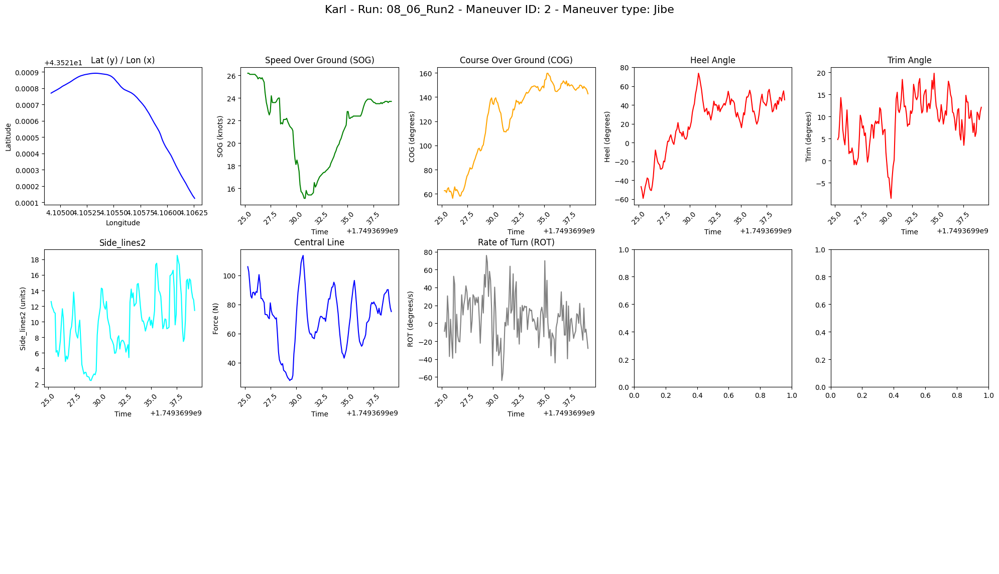

Summary for Karl - Run: 08_06_Run3

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:13:21.556000+00:00
  Maneuver Type: Jibe
  Duration: 14.003000020980837 seconds
  Start Time: 1749370401.556
  End Time: 1749370415.559
  boat_name: Karl Maeder



avg TWS: 8.31 knots
avg TWA: -61.56 degrees
avg TWD: 289.73 degrees


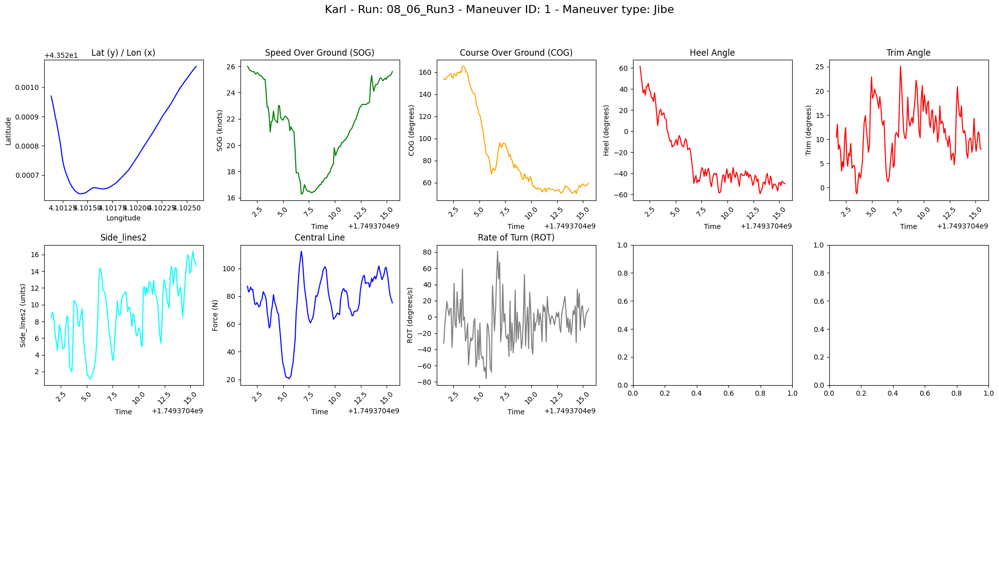


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:13:51.757000+00:00
  Maneuver Type: Jibe
  Duration: 14.101999998092651 seconds
  Start Time: 1749370431.757
  End Time: 1749370445.859
  boat_name: Karl Maeder



avg TWS: 8.16 knots
avg TWA: 31.78 degrees
avg TWD: 288.19 degrees


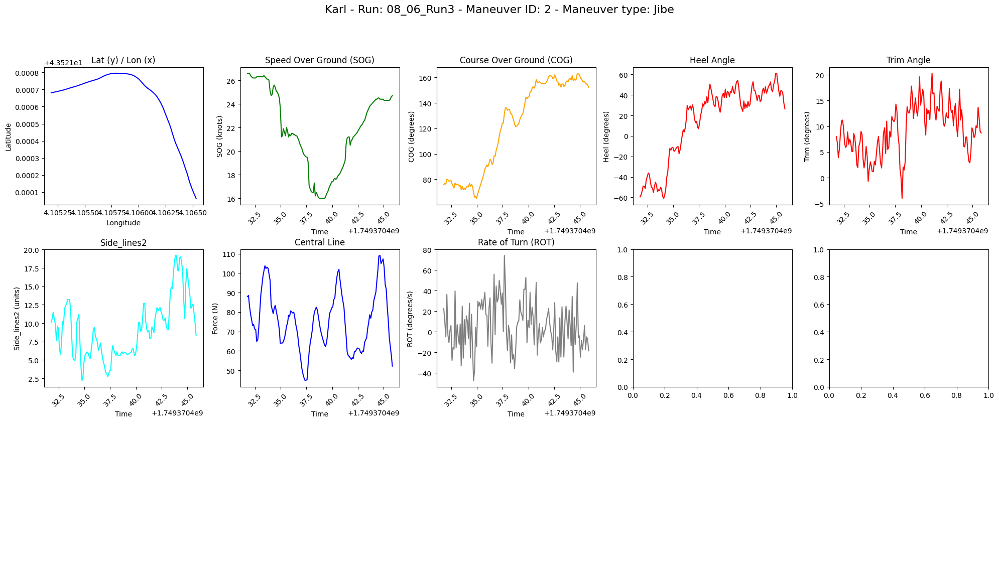


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:15:47.260000+00:00
  Maneuver Type: Jibe
  Duration: 14.002000093460085 seconds
  Start Time: 1749370547.26
  End Time: 1749370561.262
  boat_name: Karl Maeder



avg TWS: 7.65 knots
avg TWA: -61.69 degrees
avg TWD: 294.76 degrees


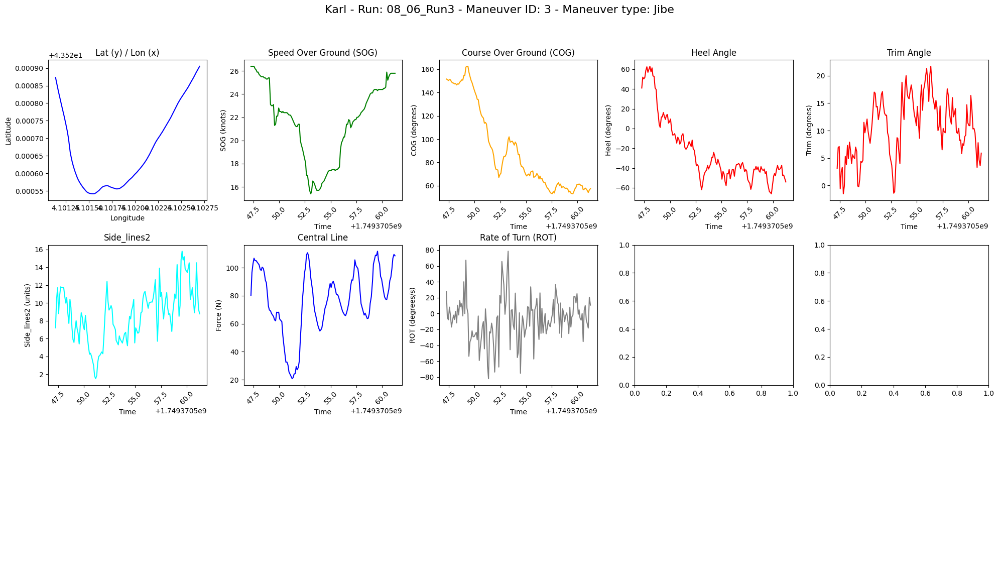


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 08:16:16.859000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749370576.859
  End Time: 1749370590.859
  boat_name: Karl Maeder



avg TWS: 7.45 knots
avg TWA: 48.12 degrees
avg TWD: 285.22 degrees


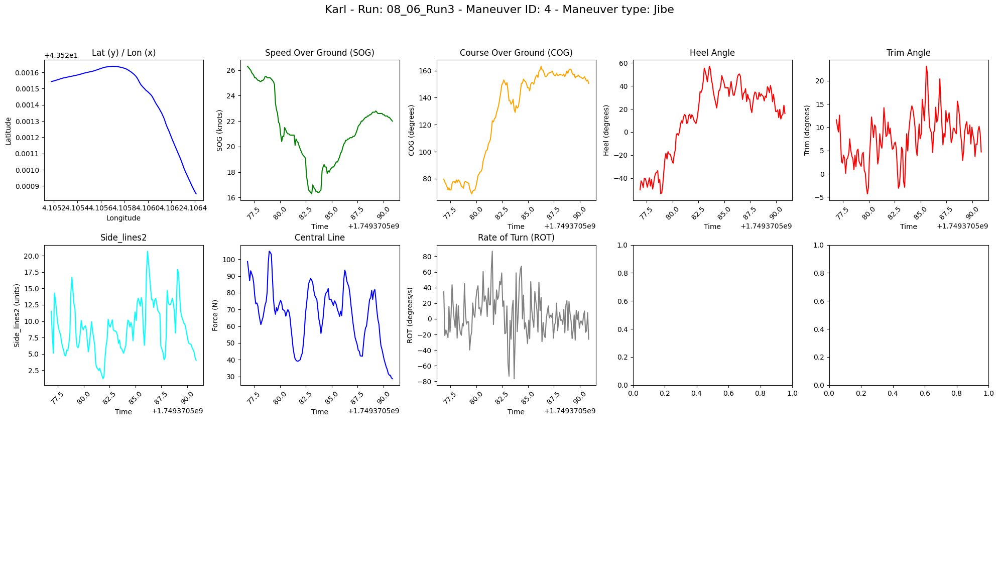

Summary for Karl - Run: 08_06_Run4

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:23:01.563000+00:00
  Maneuver Type: Jibe
  Duration: 13.998000144958496 seconds
  Start Time: 1749370981.563
  End Time: 1749370995.561
  boat_name: Karl Maeder



avg TWS: 6.48 knots
avg TWA: -42.98 degrees
avg TWD: 302.83 degrees


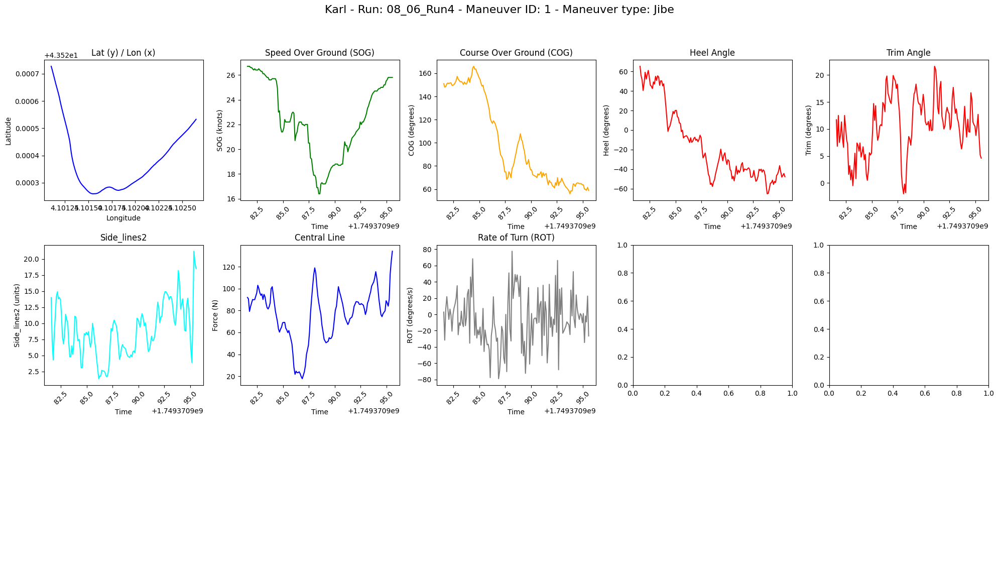


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:25:33.560000+00:00
  Maneuver Type: Jibe
  Duration: 13.999000072479248 seconds
  Start Time: 1749371133.56
  End Time: 1749371147.559
  boat_name: Karl Maeder



avg TWS: 8.27 knots
avg TWA: -73.02 degrees
avg TWD: 285.25 degrees


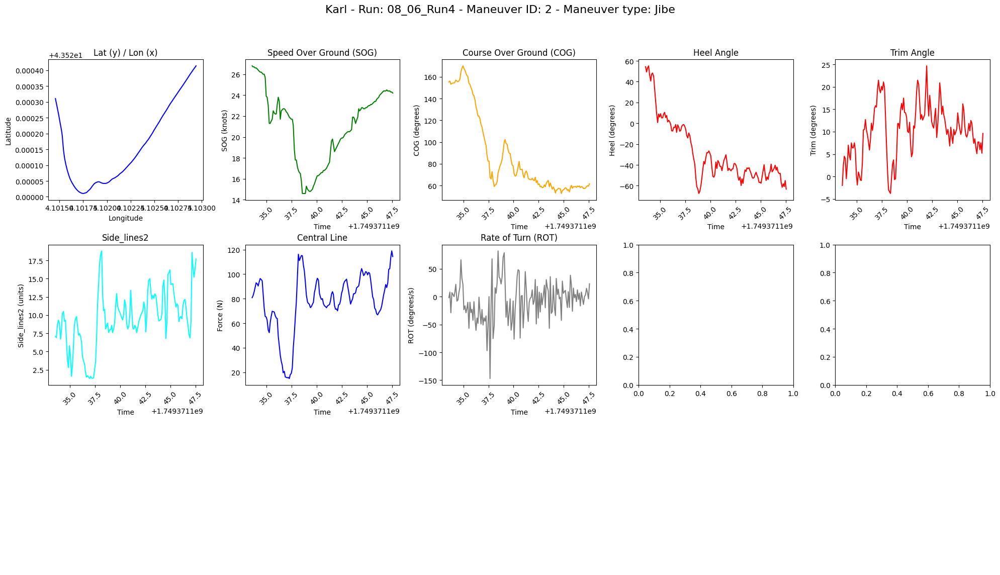


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:26:05.859000+00:00
  Maneuver Type: Jibe
  Duration: 13.999000072479248 seconds
  Start Time: 1749371165.859
  End Time: 1749371179.858
  boat_name: Karl Maeder



avg TWS: 7.40 knots
avg TWA: 46.28 degrees
avg TWD: 281.68 degrees


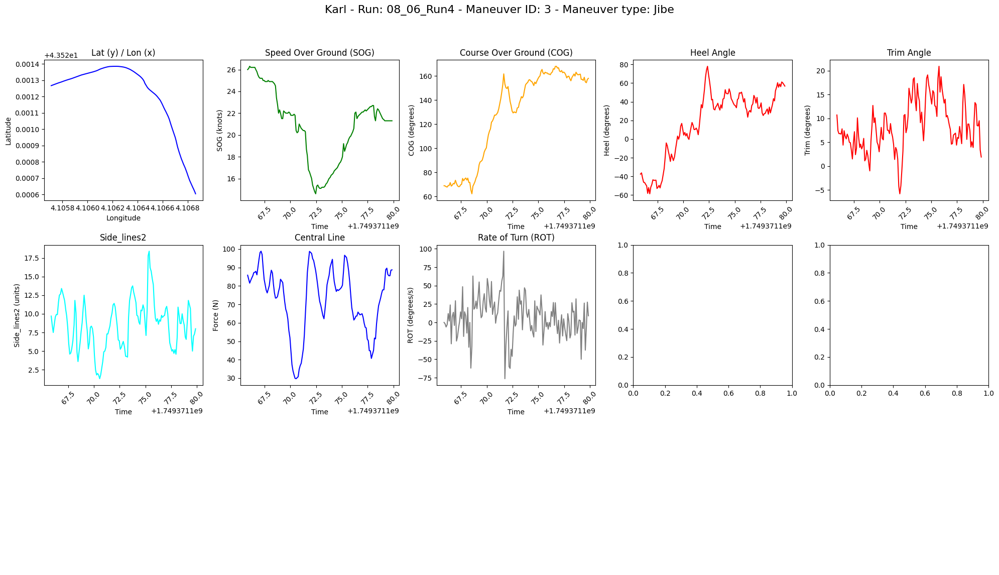

Summary for Karl - Run: 08_06_Run5

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:33:35.757000+00:00
  Maneuver Type: Jibe
  Duration: 13.999000072479248 seconds
  Start Time: 1749371615.757
  End Time: 1749371629.756
  boat_name: Karl Maeder



avg TWS: 7.01 knots
avg TWA: -59.64 degrees
avg TWD: 294.53 degrees


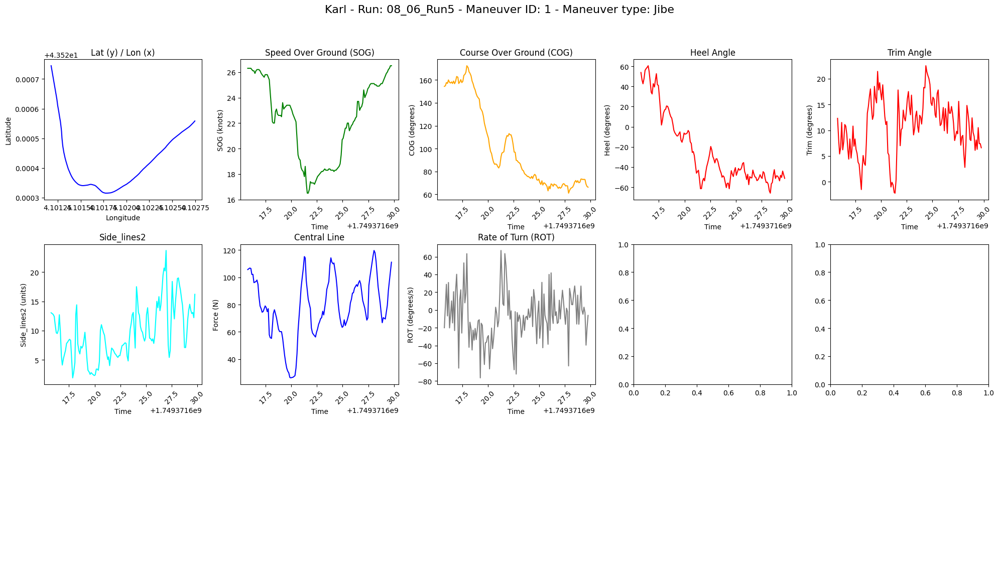

Summary for Karl - Run: 08_06_Run6

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:45:49.657000+00:00
  Maneuver Type: Jibe
  Duration: 14.098999977111816 seconds
  Start Time: 1749372349.657
  End Time: 1749372363.756
  boat_name: Karl Maeder



avg TWS: 8.22 knots
avg TWA: -62.55 degrees
avg TWD: 287.55 degrees


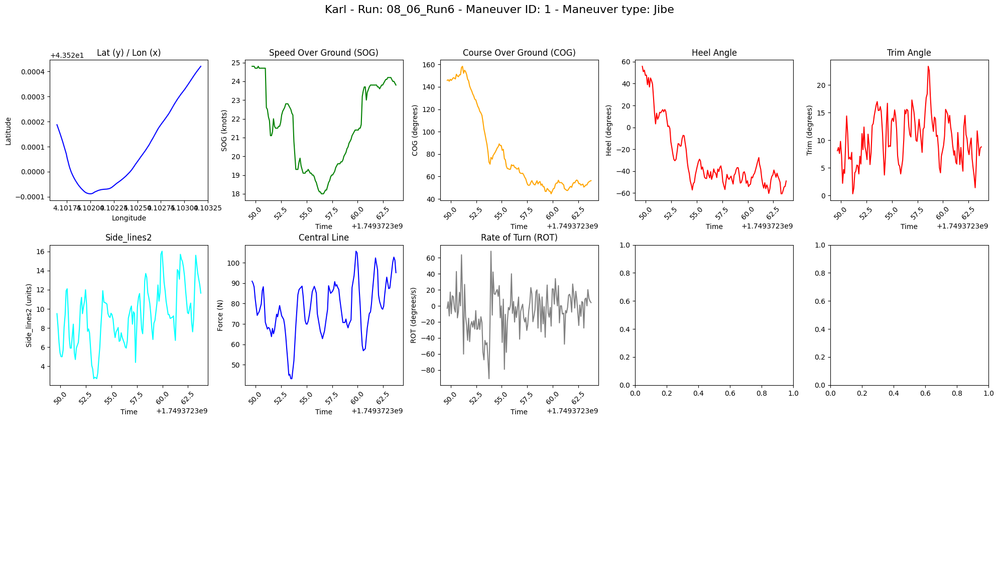


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:48:31.053000+00:00
  Maneuver Type: Jibe
  Duration: 14.104000091552734 seconds
  Start Time: 1749372511.053
  End Time: 1749372525.157
  boat_name: Karl Maeder



avg TWS: 5.97 knots
avg TWA: -55.18 degrees
avg TWD: 290.65 degrees


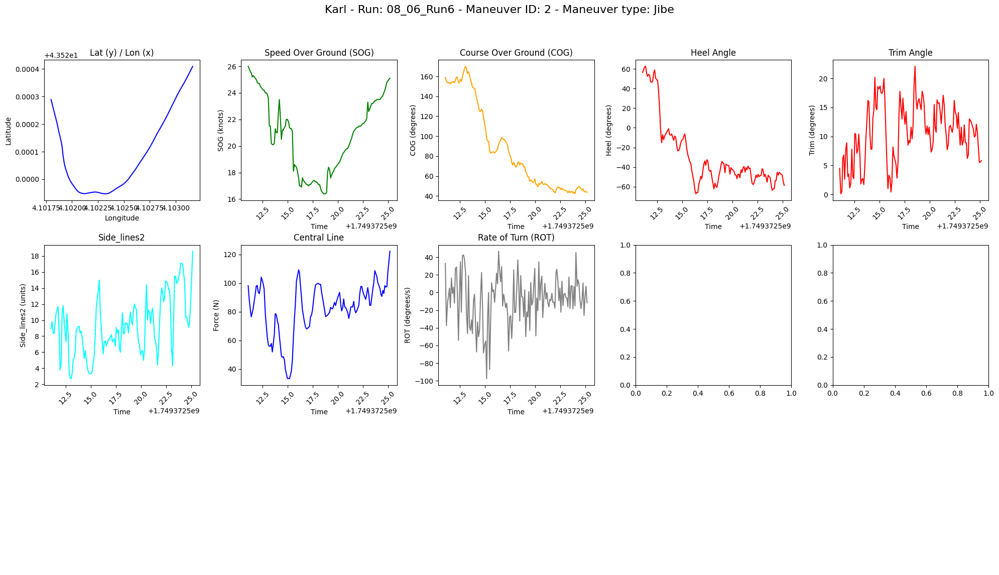


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:49:03.262000+00:00
  Maneuver Type: Jibe
  Duration: 14.001999855041504 seconds
  Start Time: 1749372543.262
  End Time: 1749372557.264
  boat_name: Karl Maeder



avg TWS: 5.19 knots
avg TWA: 57.15 degrees
avg TWD: 298.22 degrees


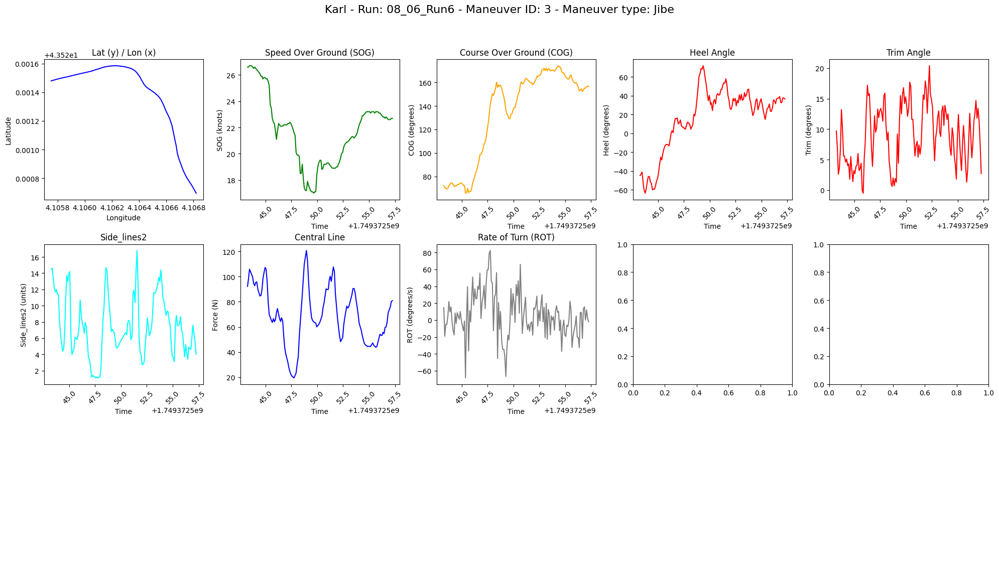

Summary for Karl - Run: 11_06_Run1

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 12:26:22.959000+00:00
  Maneuver Type: Jibe
  Duration: 13.997999906539915 seconds
  Start Time: 1749644782.959
  End Time: 1749644796.957
  boat_name: Karl Maeder



avg TWS: 5.23 knots
avg TWA: -76.06 degrees
avg TWD: 192.85 degrees


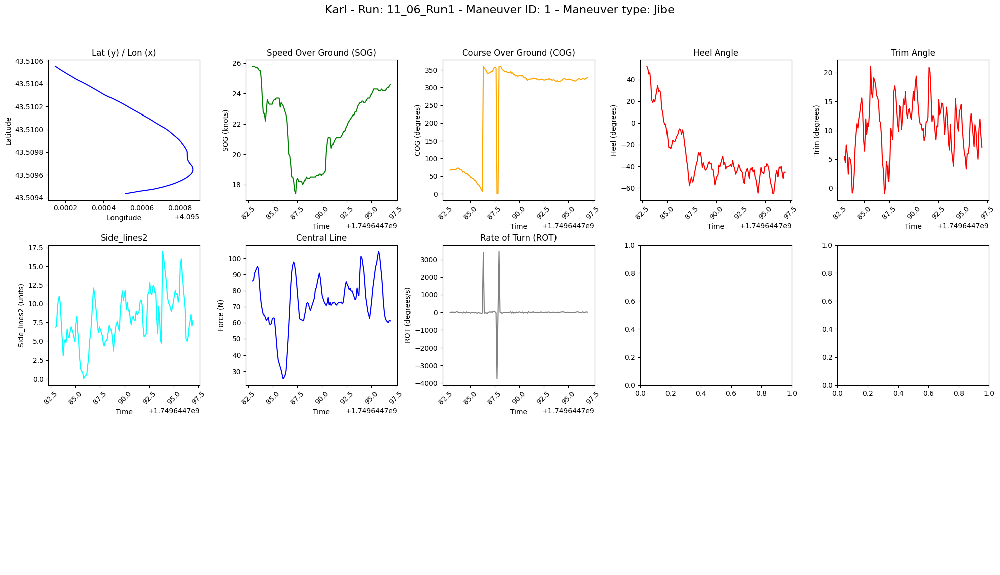


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 12:26:54.956000+00:00
  Maneuver Type: Jibe
  Duration: 14.003000020980837 seconds
  Start Time: 1749644814.956
  End Time: 1749644828.959
  boat_name: Karl Maeder



avg TWS: 4.92 knots
avg TWA: 37.63 degrees
avg TWD: 189.47 degrees


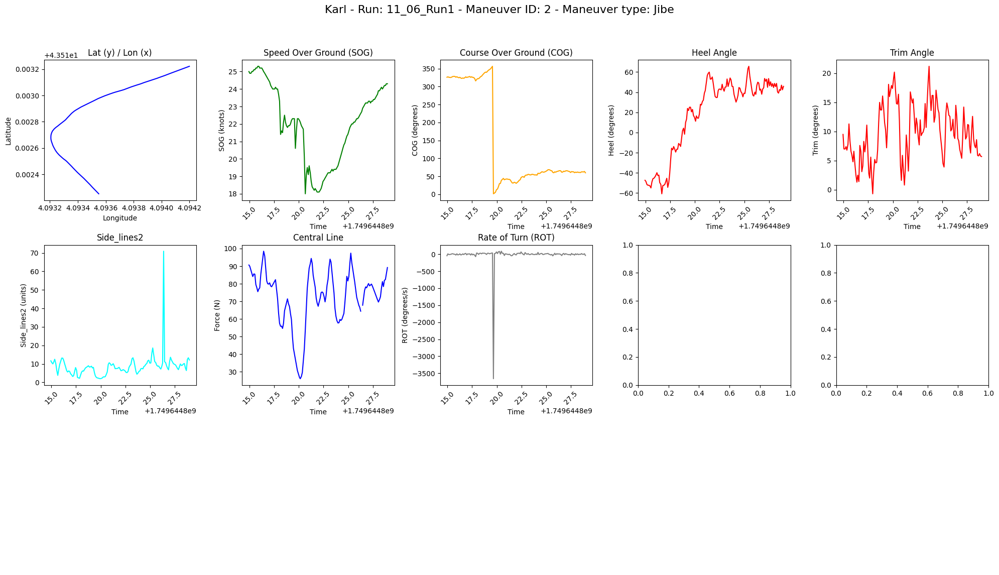


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 12:29:31.559000+00:00
  Maneuver Type: Jibe
  Duration: 14.096999883651732 seconds
  Start Time: 1749644971.559
  End Time: 1749644985.656
  boat_name: Karl Maeder



avg TWS: 5.80 knots
avg TWA: -80.40 degrees
avg TWD: 191.54 degrees


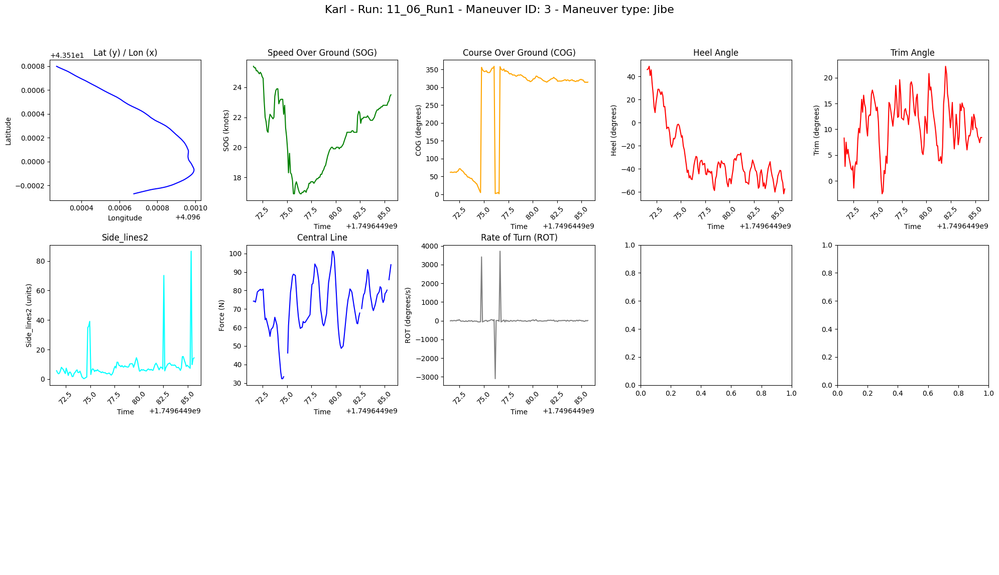


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 12:30:04.855000+00:00
  Maneuver Type: Jibe
  Duration: 14.092999935150146 seconds
  Start Time: 1749645004.855
  End Time: 1749645018.948
  boat_name: Karl Maeder



avg TWS: 5.62 knots
avg TWA: 65.08 degrees
avg TWD: 194.39 degrees


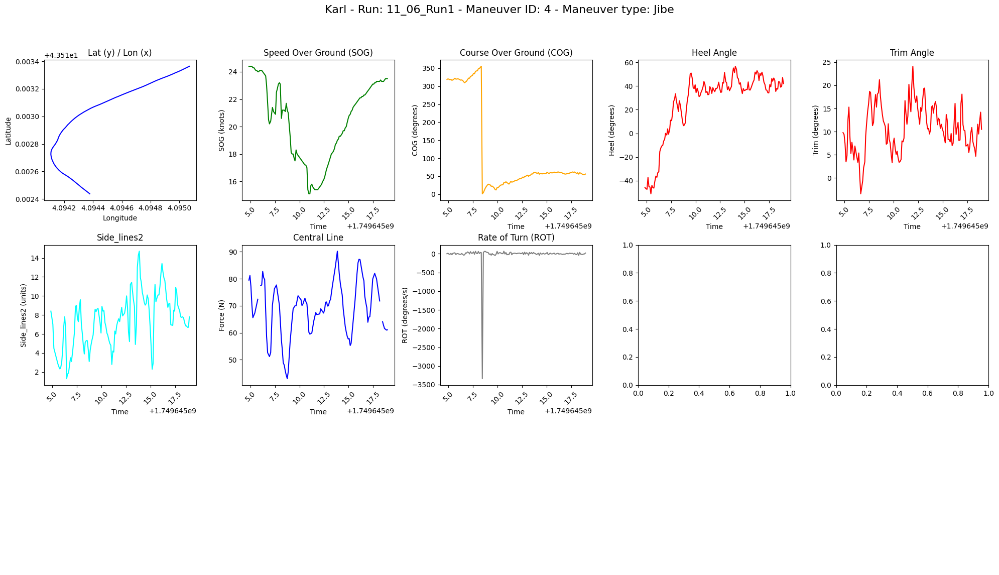

Summary for Karl - Run: 11_06_Run2

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 12:38:49.255000+00:00
  Maneuver Type: Jibe
  Duration: 13.911999940872192 seconds
  Start Time: 1749645529.255
  End Time: 1749645543.167
  boat_name: Karl Maeder



avg TWS: 5.95 knots
avg TWA: -80.79 degrees
avg TWD: 191.05 degrees


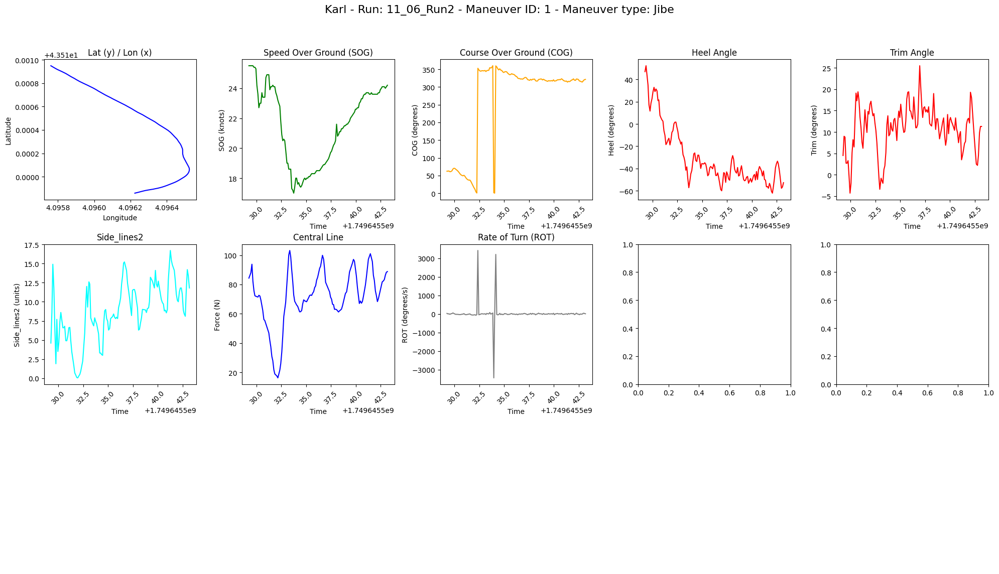


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 12:39:17.960000+00:00
  Maneuver Type: Jibe
  Duration: 13.999000072479248 seconds
  Start Time: 1749645557.96
  End Time: 1749645571.959
  boat_name: Karl Maeder



avg TWS: 6.56 knots
avg TWA: 38.80 degrees
avg TWD: 188.42 degrees


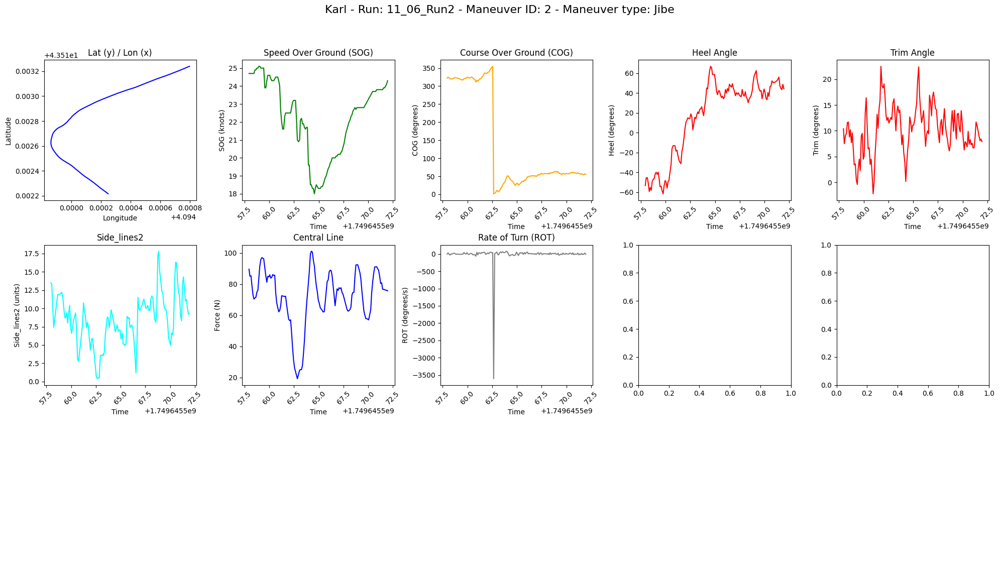


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 12:41:44.655000+00:00
  Maneuver Type: Jibe
  Duration: 13.90400004386902 seconds
  Start Time: 1749645704.655
  End Time: 1749645718.559
  boat_name: Karl Maeder



avg TWS: 5.42 knots
avg TWA: -76.03 degrees
avg TWD: 188.73 degrees


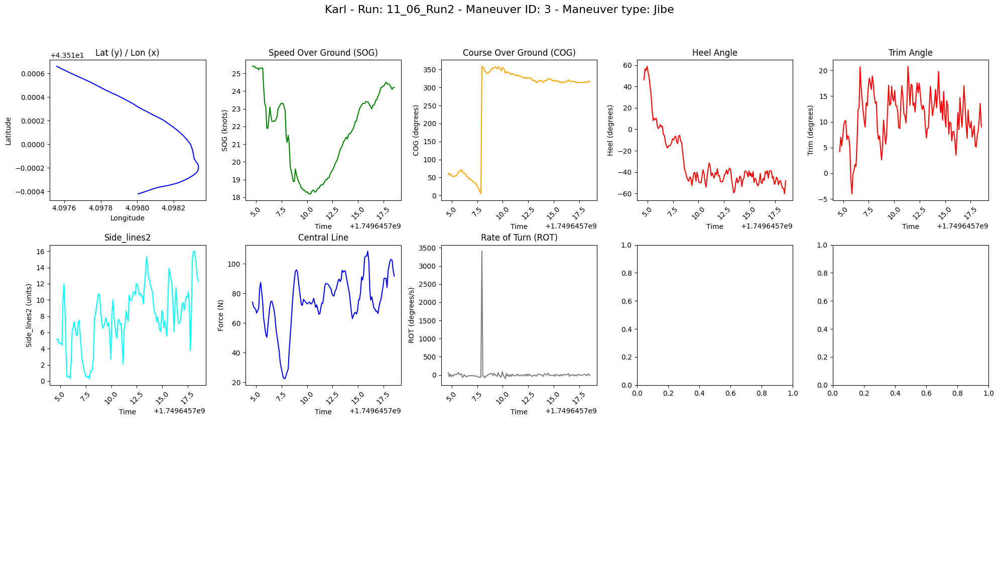


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 12:42:19.657000+00:00
  Maneuver Type: Jibe
  Duration: 13.90400004386902 seconds
  Start Time: 1749645739.657
  End Time: 1749645753.561
  boat_name: Karl Maeder



avg TWS: 5.32 knots
avg TWA: 46.70 degrees
avg TWD: 185.99 degrees


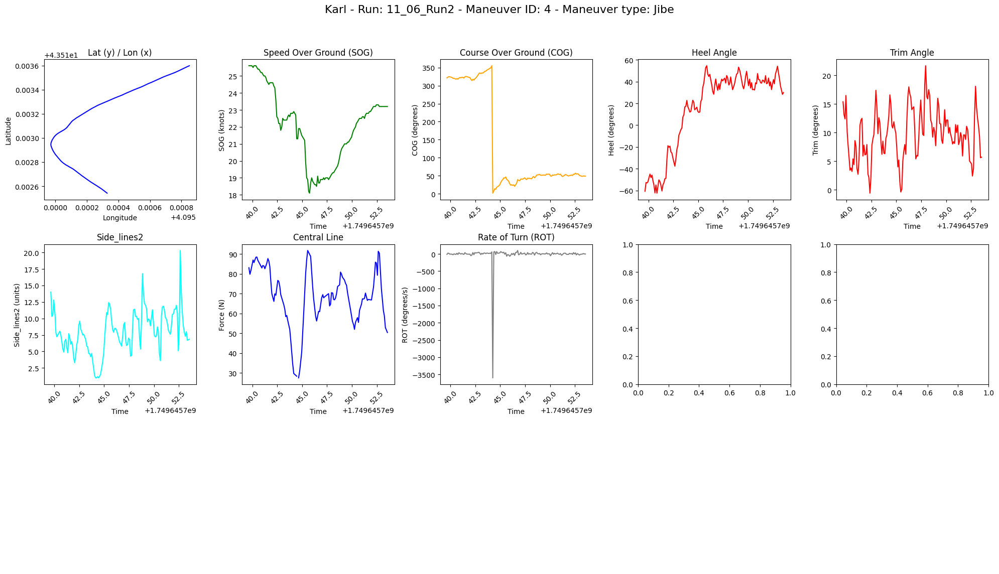

Summary for Karl - Run: 11_06_Run3

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 12:49:51.059000+00:00
  Maneuver Type: Jibe
  Duration: 14.1010000705719 seconds
  Start Time: 1749646191.059
  End Time: 1749646205.16
  boat_name: Karl Maeder



avg TWS: 6.15 knots
avg TWA: -82.46 degrees
avg TWD: 194.75 degrees


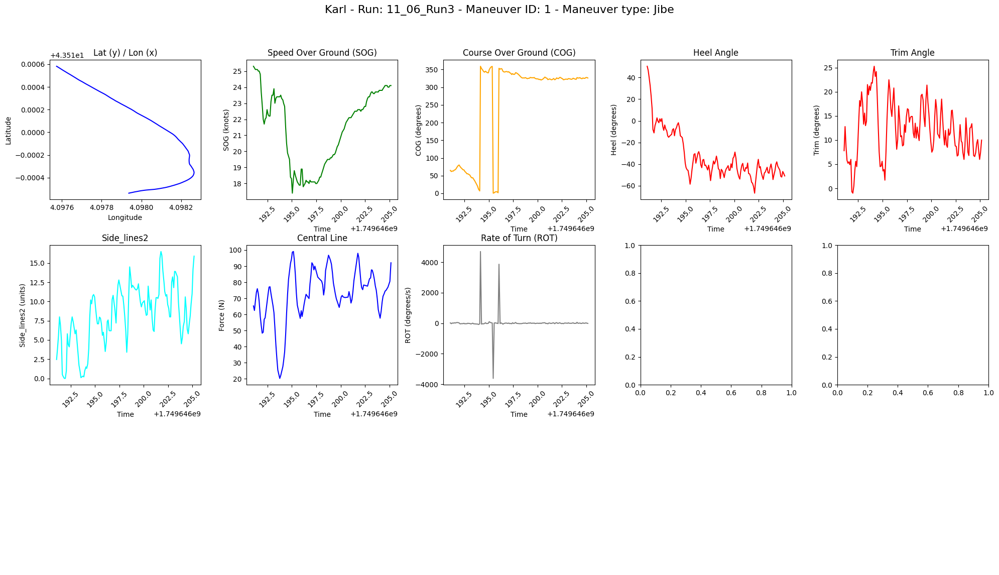


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 12:50:31.052000+00:00
  Maneuver Type: Jibe
  Duration: 13.907000064849854 seconds
  Start Time: 1749646231.052
  End Time: 1749646244.959
  boat_name: Karl Maeder



avg TWS: 5.87 knots
avg TWA: 88.75 degrees
avg TWD: 196.85 degrees


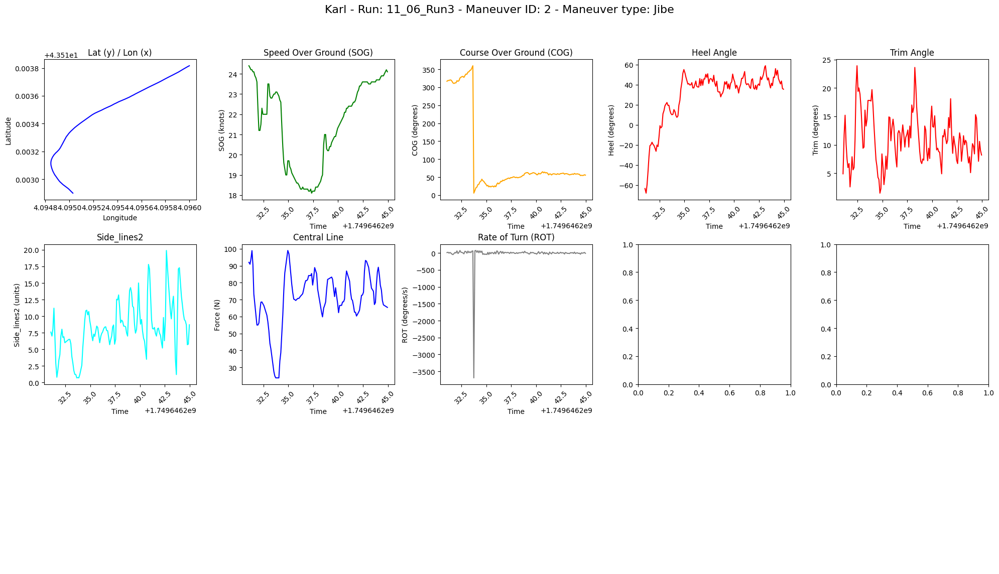


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 12:52:50.257000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749646370.257
  End Time: 1749646384.257
  boat_name: Karl Maeder



avg TWS: 5.46 knots
avg TWA: -77.51 degrees
avg TWD: 193.30 degrees


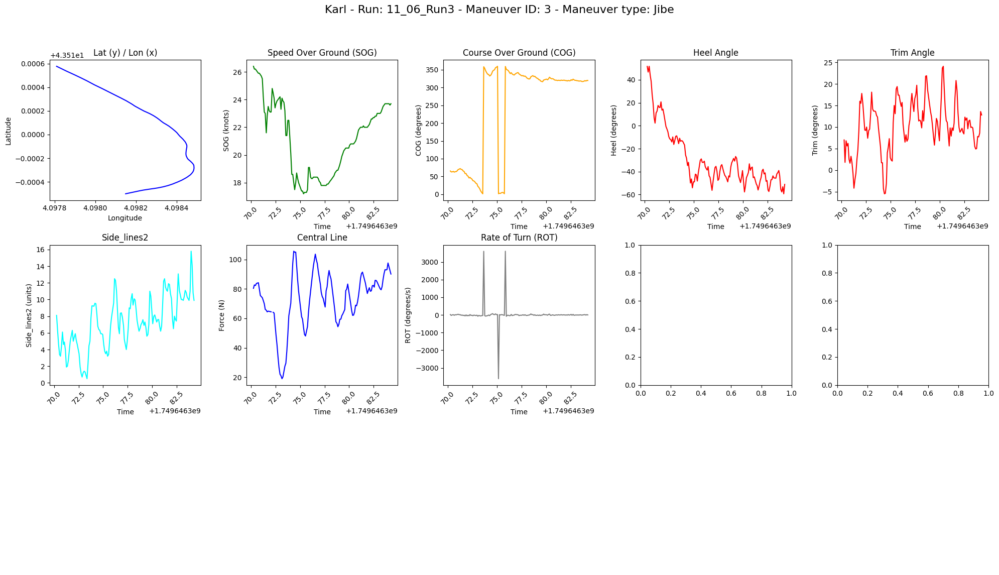


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 12:53:29.657000+00:00
  Maneuver Type: Jibe
  Duration: 14.101999998092651 seconds
  Start Time: 1749646409.657
  End Time: 1749646423.759
  boat_name: Karl Maeder



avg TWS: 6.06 knots
avg TWA: 47.03 degrees
avg TWD: 189.92 degrees


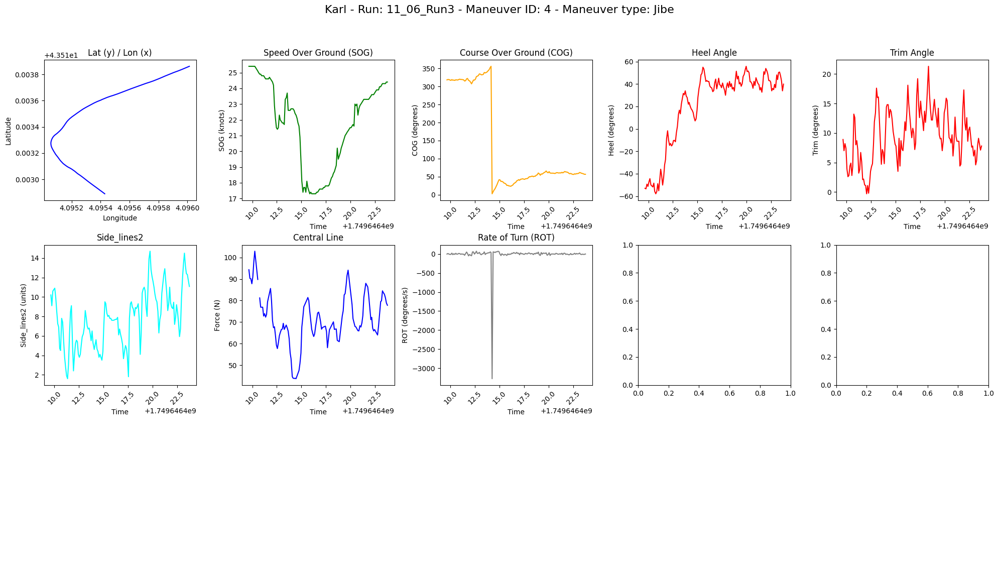

Summary for Karl - Run: 11_06_Run4

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 13:03:35.061000+00:00
  Maneuver Type: Jibe
  Duration: 14.09599995613098 seconds
  Start Time: 1749647015.061
  End Time: 1749647029.157
  boat_name: Karl Maeder



avg TWS: 6.93 knots
avg TWA: -80.62 degrees
avg TWD: 180.90 degrees


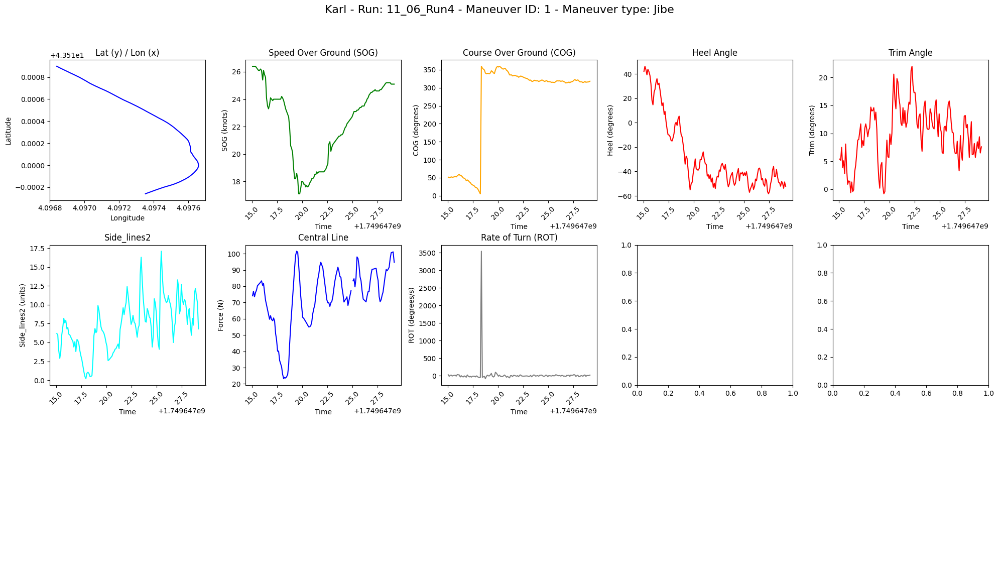


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 13:04:03.157000+00:00
  Maneuver Type: Jibe
  Duration: 14.101999998092651 seconds
  Start Time: 1749647043.157
  End Time: 1749647057.259
  boat_name: Karl Maeder



avg TWS: 6.72 knots
avg TWA: 43.53 degrees
avg TWD: 184.75 degrees


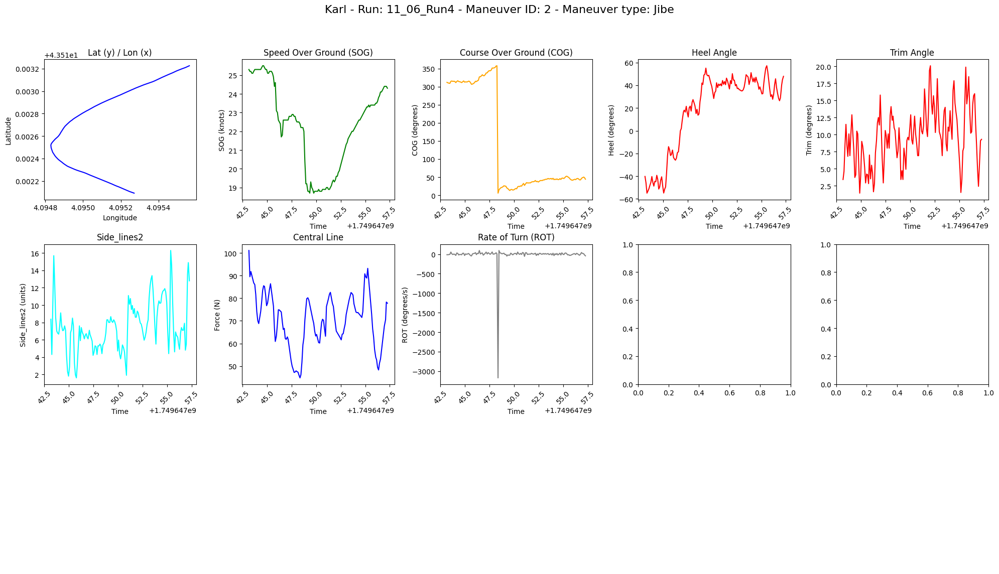

Summary for Karl - Run: 11_06_Run5

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 13:11:27.453000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749647487.453
  End Time: 1749647501.453
  boat_name: Karl Maeder



avg TWS: 5.18 knots
avg TWA: -90.48 degrees
avg TWD: 180.09 degrees


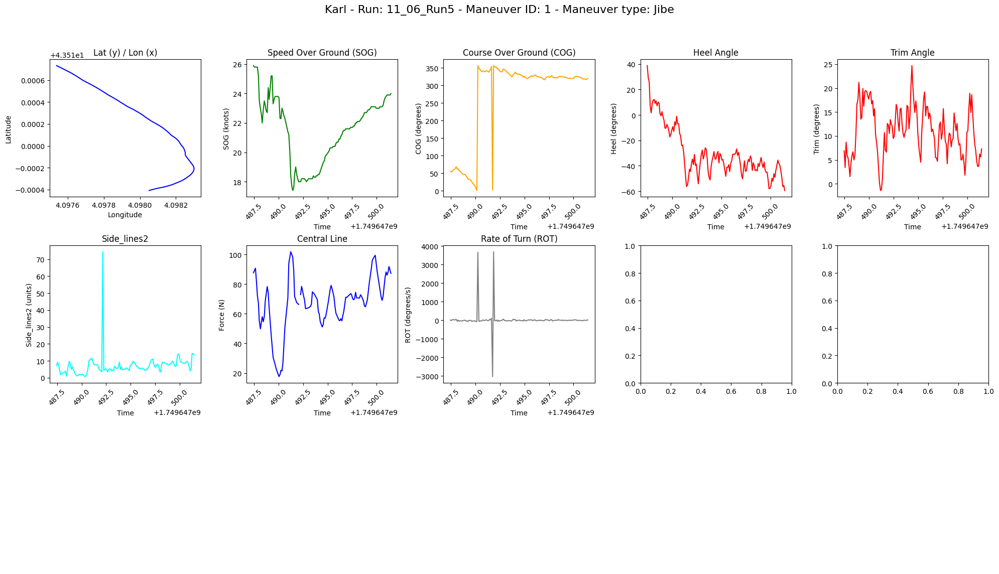


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 13:12:02.654000+00:00
  Maneuver Type: Jibe
  Duration: 14.001999855041504 seconds
  Start Time: 1749647522.654
  End Time: 1749647536.656
  boat_name: Karl Maeder



avg TWS: 5.79 knots
avg TWA: 36.57 degrees
avg TWD: 185.33 degrees


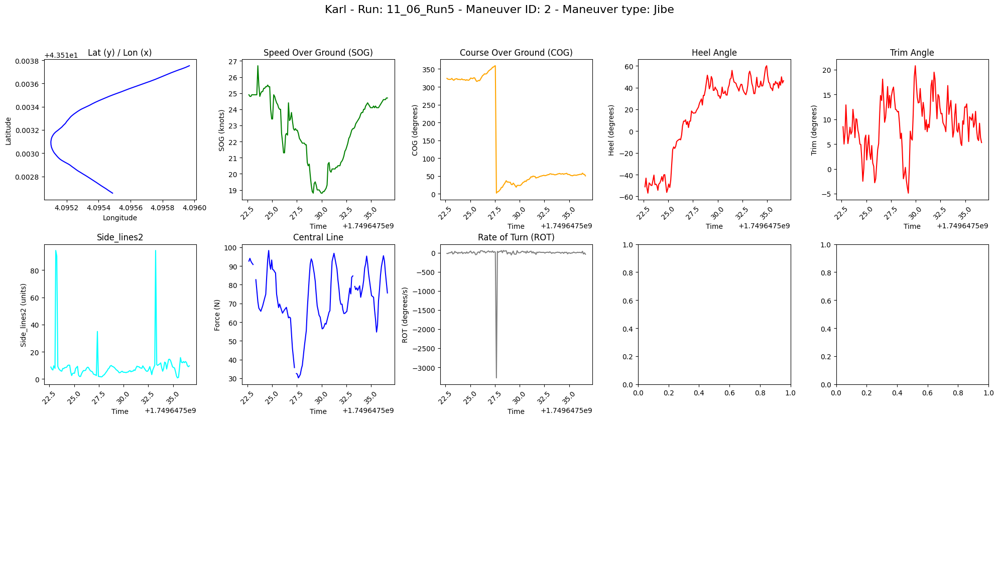


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 13:14:21.656000+00:00
  Maneuver Type: Jibe
  Duration: 13.998000144958496 seconds
  Start Time: 1749647661.656
  End Time: 1749647675.654
  boat_name: Karl Maeder



avg TWS: 6.08 knots
avg TWA: -79.56 degrees
avg TWD: 180.78 degrees


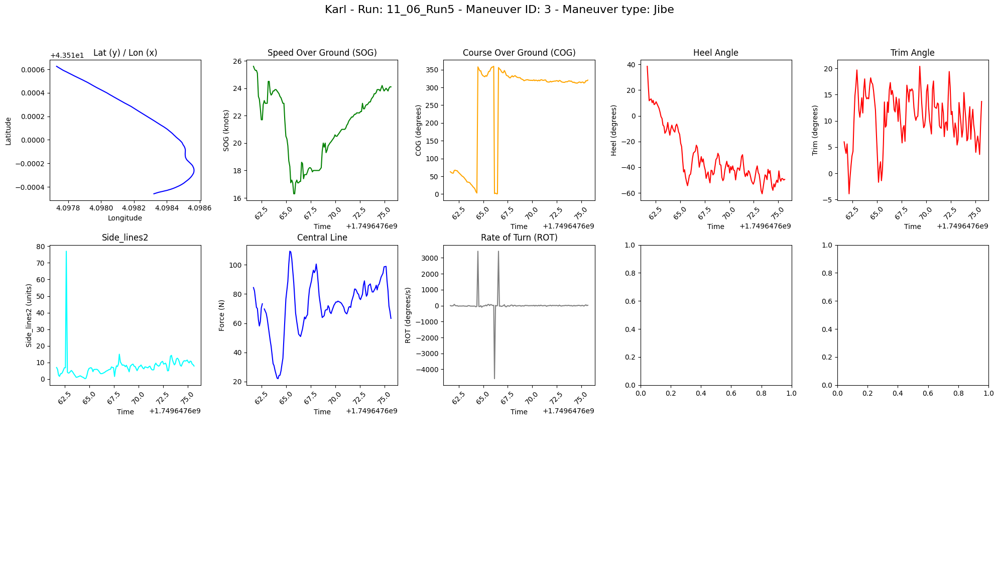


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 13:14:58.157000+00:00
  Maneuver Type: Jibe
  Duration: 14.006999969482422 seconds
  Start Time: 1749647698.157
  End Time: 1749647712.164
  boat_name: Karl Maeder



avg TWS: 5.21 knots
avg TWA: 33.14 degrees
avg TWD: 184.27 degrees


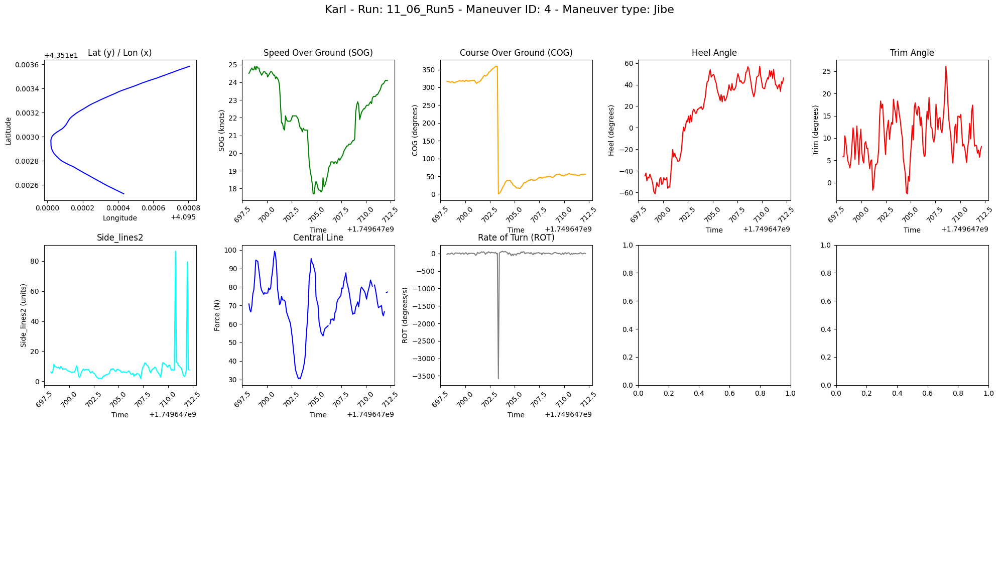

Summary for Karl - Run: 11_06_Run6

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 13:23:35.360000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749648215.36
  End Time: 1749648229.36
  boat_name: Karl Maeder



avg TWS: 6.09 knots
avg TWA: -80.60 degrees
avg TWD: 192.03 degrees


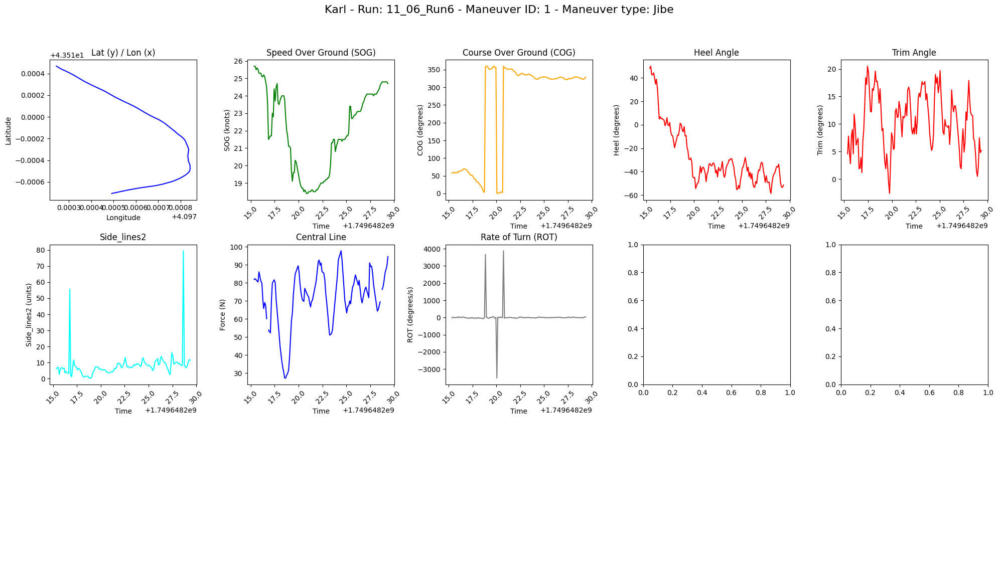


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 13:24:11.360000+00:00
  Maneuver Type: Jibe
  Duration: 14.001000165939333 seconds
  Start Time: 1749648251.36
  End Time: 1749648265.361
  boat_name: Karl Maeder



avg TWS: 5.47 knots
avg TWA: 44.98 degrees
avg TWD: 188.14 degrees


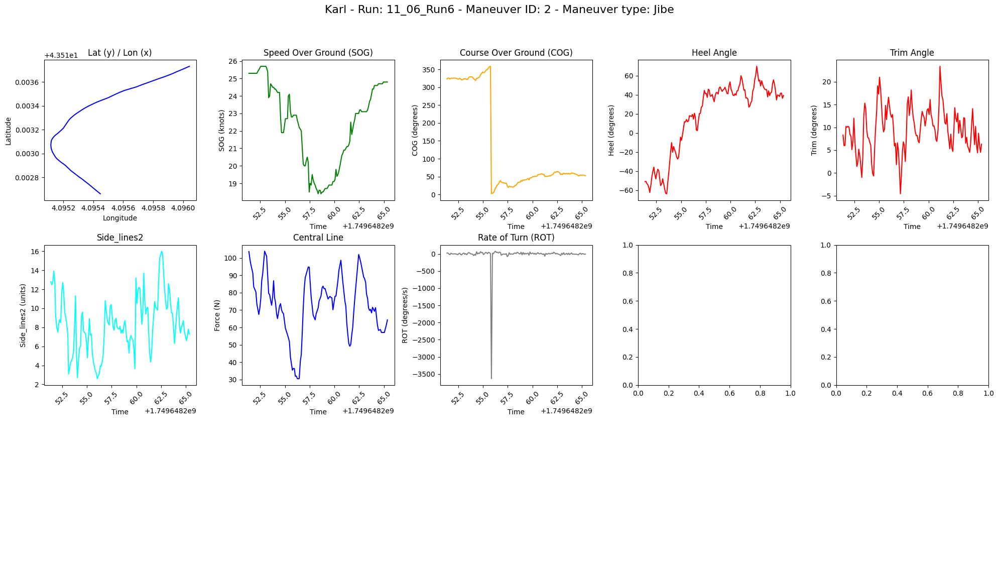


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 13:26:32.454000+00:00
  Maneuver Type: Jibe
  Duration: 14.101999998092651 seconds
  Start Time: 1749648392.454
  End Time: 1749648406.556
  boat_name: Karl Maeder



avg TWS: 6.06 knots
avg TWA: -75.71 degrees
avg TWD: 188.18 degrees


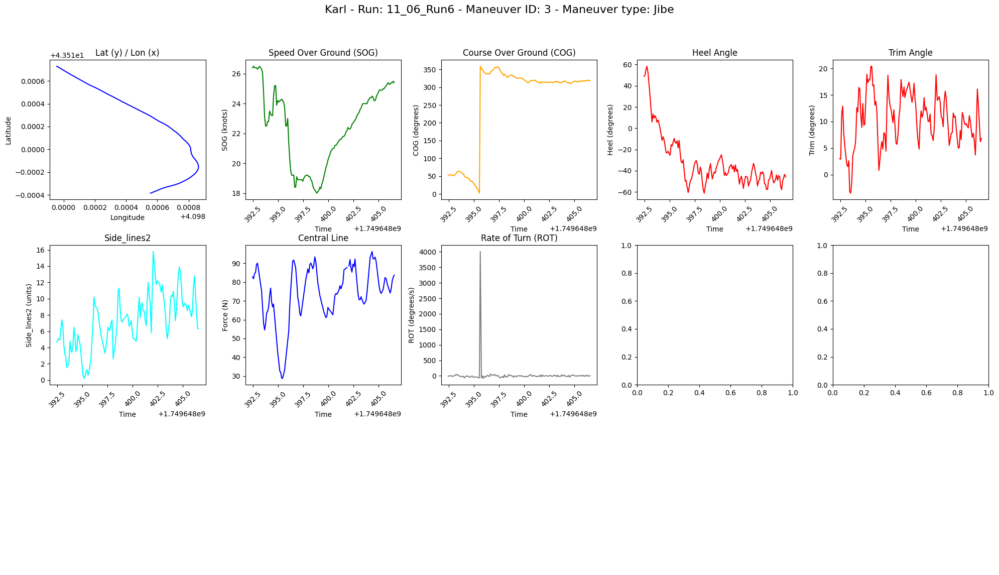


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 13:27:08.061000+00:00
  Maneuver Type: Jibe
  Duration: 13.98799991607666 seconds
  Start Time: 1749648428.061
  End Time: 1749648442.049
  boat_name: Karl Maeder



avg TWS: 6.29 knots
avg TWA: 41.89 degrees
avg TWD: 189.66 degrees


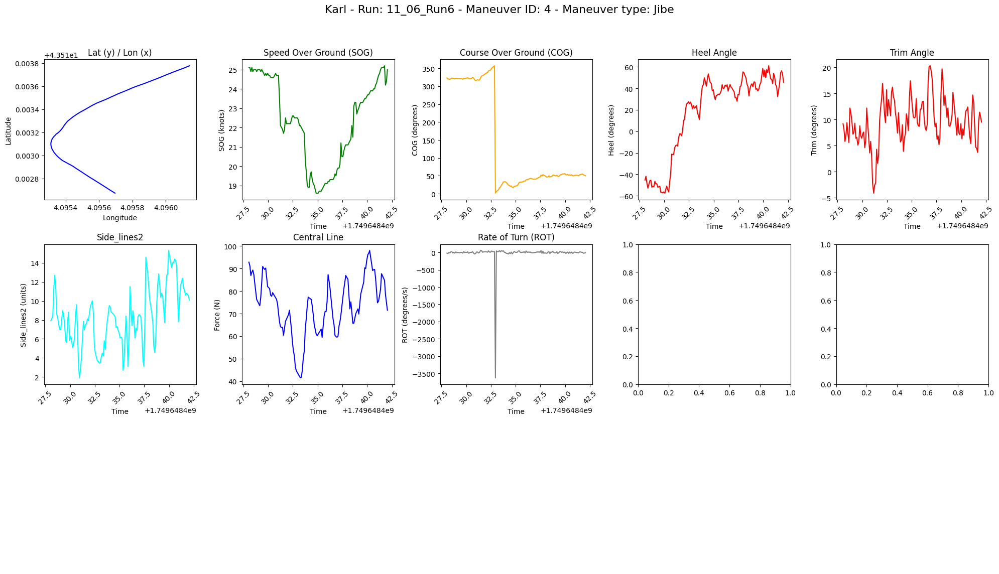

In [2]:
plot(df, 'Karl')

### Maneuvers of Gian: 

Summary for Gian - Run: 08_06_Run1

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:03:10.157000+00:00
  Maneuver Type: Jibe
  Duration: 14.098999977111816 seconds
  Start Time: 1749369790.157
  End Time: 1749369804.256
  boat_name: SenseBoard



avg TWS: 8.73 knots
avg TWA: -39.68 degrees
avg TWD: 290.97 degrees


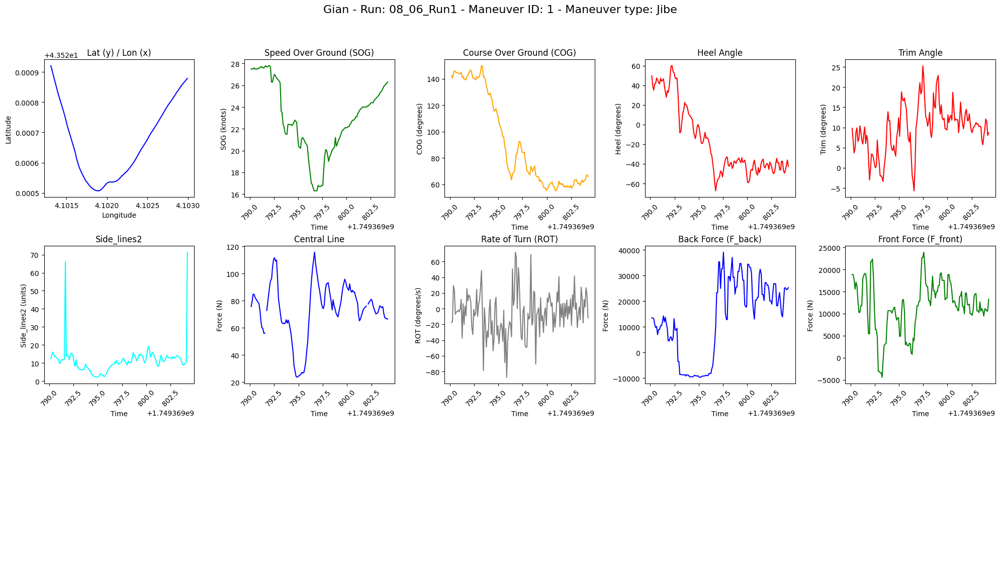


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:03:36.656000+00:00
  Maneuver Type: Jibe
  Duration: 14.005000114440918 seconds
  Start Time: 1749369816.656
  End Time: 1749369830.661
  boat_name: SenseBoard



avg TWS: 8.21 knots
avg TWA: 57.23 degrees
avg TWD: 282.56 degrees


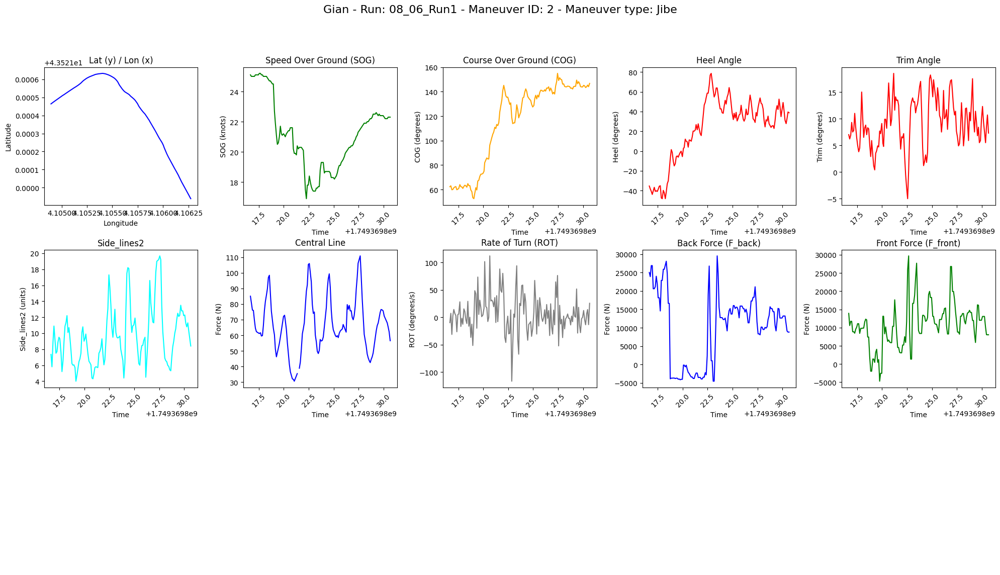


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:06:02.358000+00:00
  Maneuver Type: Jibe
  Duration: 14.098000049591064 seconds
  Start Time: 1749369962.358
  End Time: 1749369976.456
  boat_name: SenseBoard



avg TWS: 7.77 knots
avg TWA: 42.29 degrees
avg TWD: 285.79 degrees


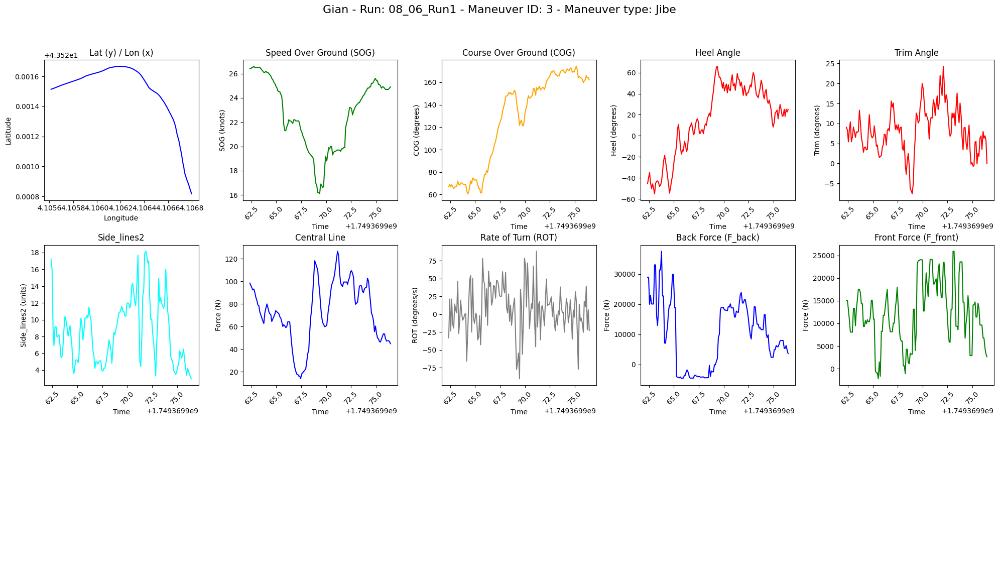

Summary for Gian - Run: 08_06_Run2

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:16:12.446000+00:00
  Maneuver Type: Jibe
  Duration: 14.01799988746643 seconds
  Start Time: 1749370572.446
  End Time: 1749370586.464
  boat_name: SenseBoard



avg TWS: 7.53 knots
avg TWA: -41.64 degrees
avg TWD: 284.79 degrees


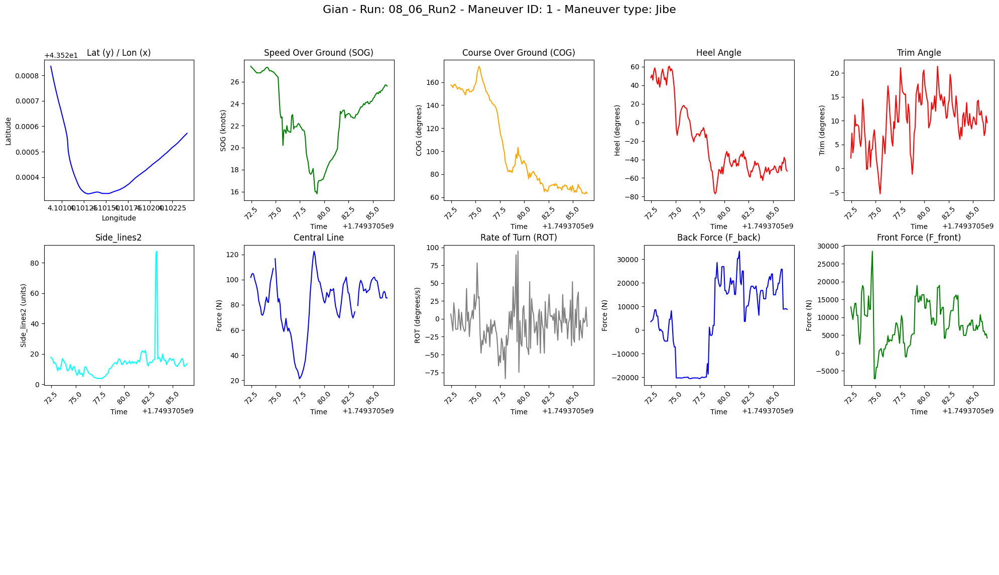


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:16:45.858000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749370605.858
  End Time: 1749370619.858
  boat_name: SenseBoard



avg TWS: 8.78 knots
avg TWA: 23.34 degrees
avg TWD: 288.78 degrees


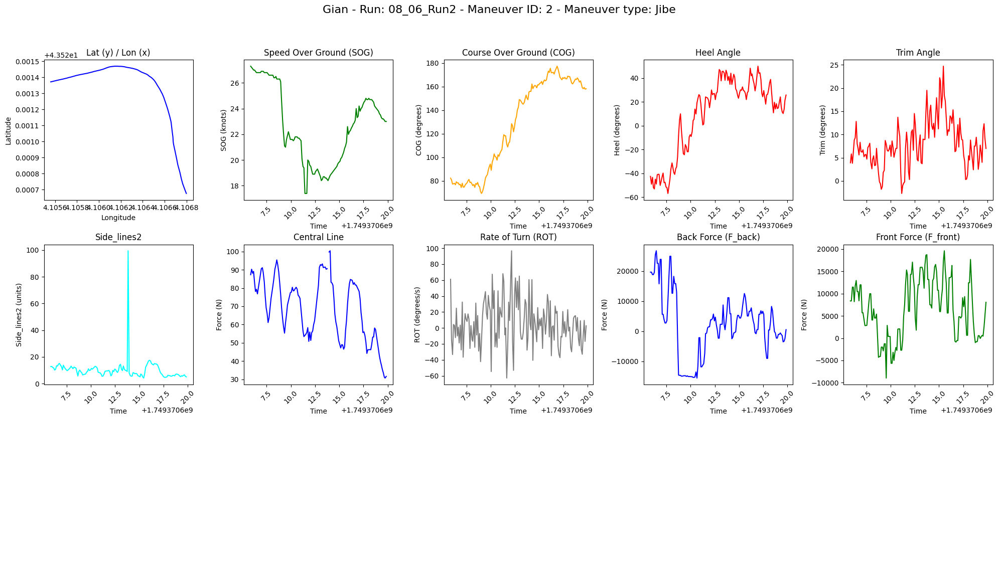


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:18:30.457000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749370710.457
  End Time: 1749370724.457
  boat_name: SenseBoard



avg TWS: 8.89 knots
avg TWA: -39.76 degrees
avg TWD: 287.79 degrees


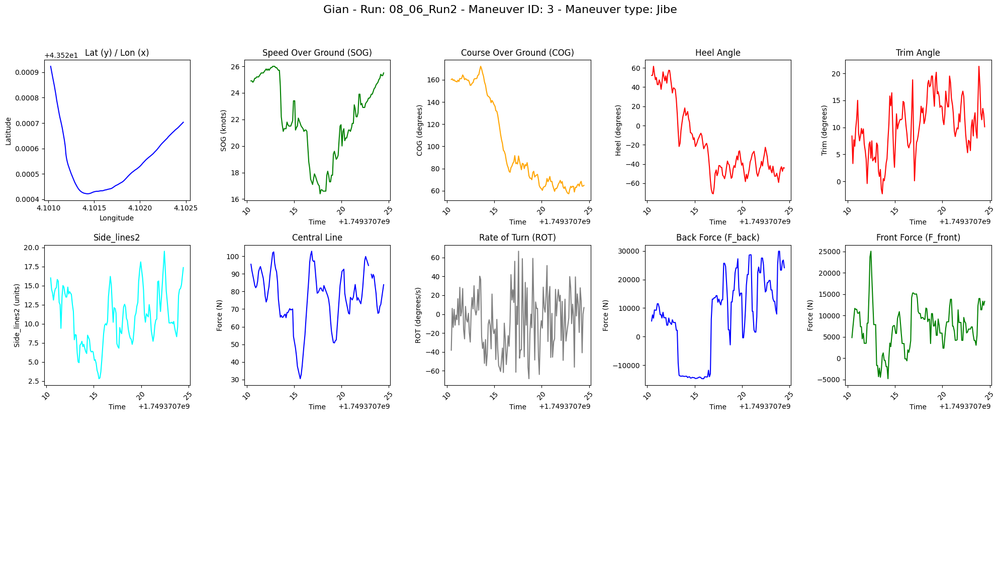


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 08:19:01.460000+00:00
  Maneuver Type: Jibe
  Duration: 14.09599995613098 seconds
  Start Time: 1749370741.46
  End Time: 1749370755.556
  boat_name: SenseBoard



avg TWS: 8.82 knots
avg TWA: 31.22 degrees
avg TWD: 292.61 degrees


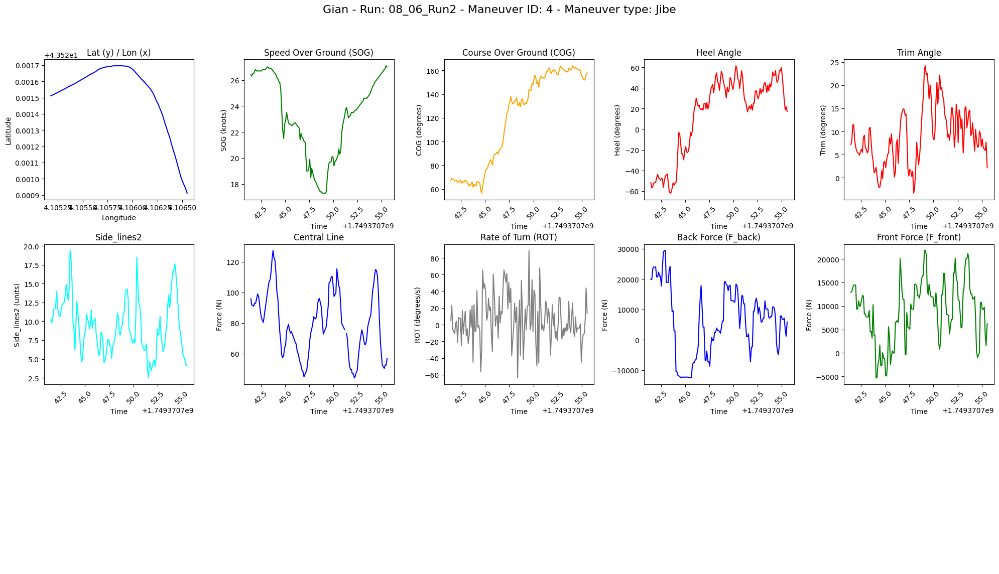

Summary for Gian - Run: 08_06_Run3

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:25:21.355000+00:00
  Maneuver Type: Jibe
  Duration: 14.1010000705719 seconds
  Start Time: 1749371121.355
  End Time: 1749371135.456
  boat_name: SenseBoard



avg TWS: 7.94 knots
avg TWA: -45.18 degrees
avg TWD: 289.79 degrees


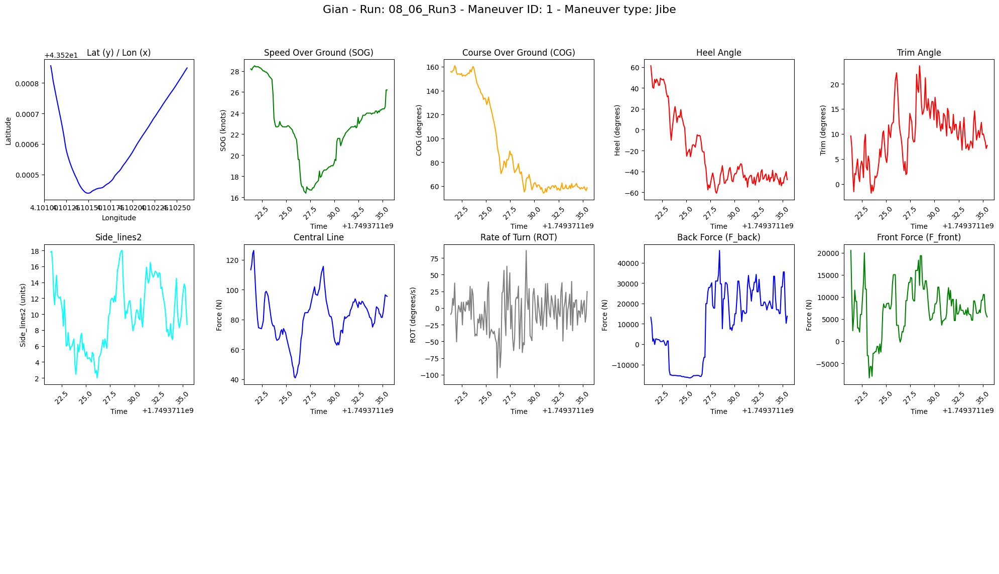


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:25:53.264000+00:00
  Maneuver Type: Jibe
  Duration: 13.99500012397766 seconds
  Start Time: 1749371153.264
  End Time: 1749371167.259
  boat_name: SenseBoard



avg TWS: 7.69 knots
avg TWA: 59.94 degrees
avg TWD: 282.12 degrees


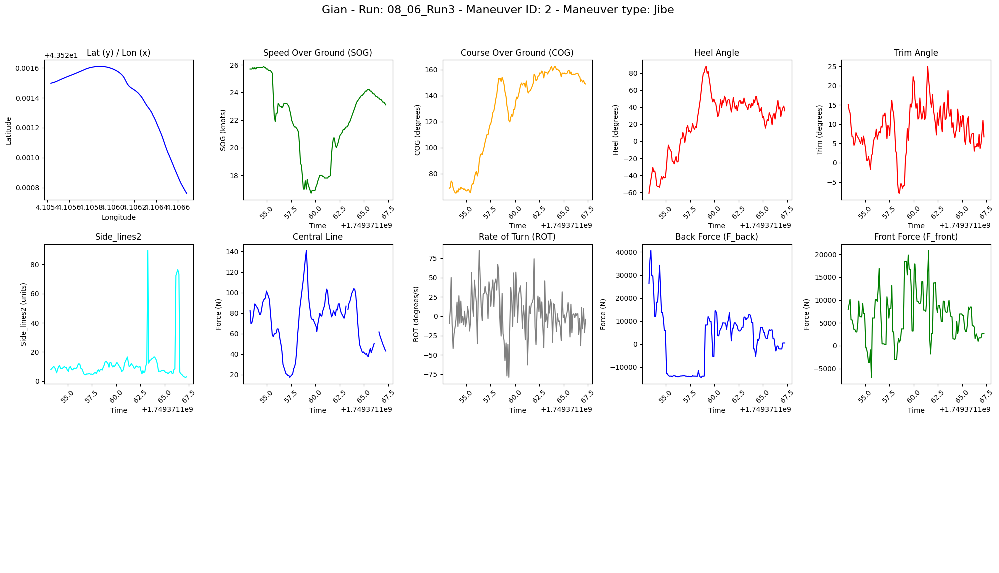

Summary for Gian - Run: 08_06_Run4

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:38:47.260000+00:00
  Maneuver Type: Jibe
  Duration: 14.09500002861023 seconds
  Start Time: 1749371927.26
  End Time: 1749371941.355
  boat_name: SenseBoard



avg TWS: 6.67 knots
avg TWA: 42.47 degrees
avg TWD: 299.64 degrees


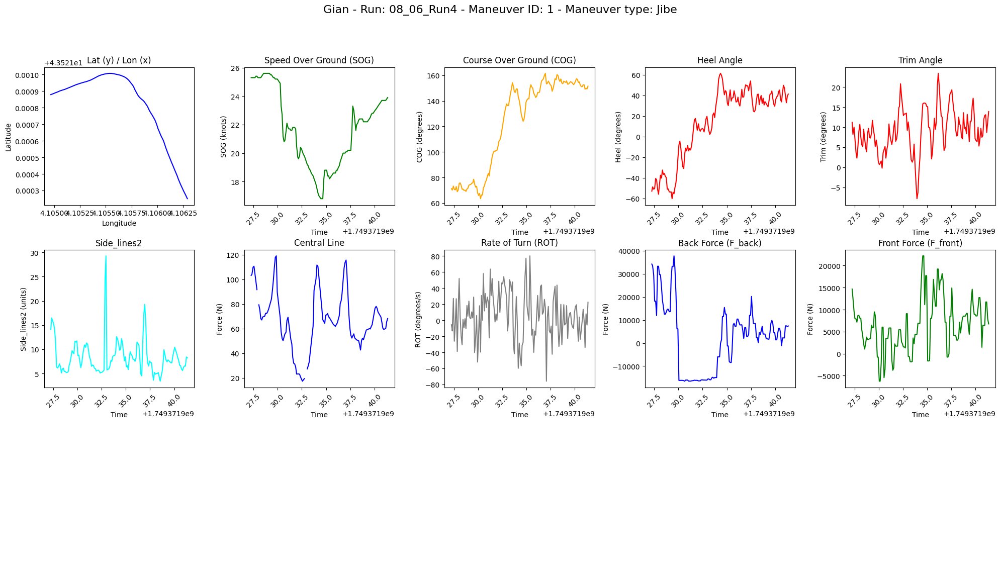

Summary for Gian - Run: 08_06_Run5

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:46:36.355000+00:00
  Maneuver Type: Jibe
  Duration: 14.1010000705719 seconds
  Start Time: 1749372396.355
  End Time: 1749372410.456
  boat_name: SenseBoard



avg TWS: 6.72 knots
avg TWA: -54.41 degrees
avg TWD: 289.84 degrees


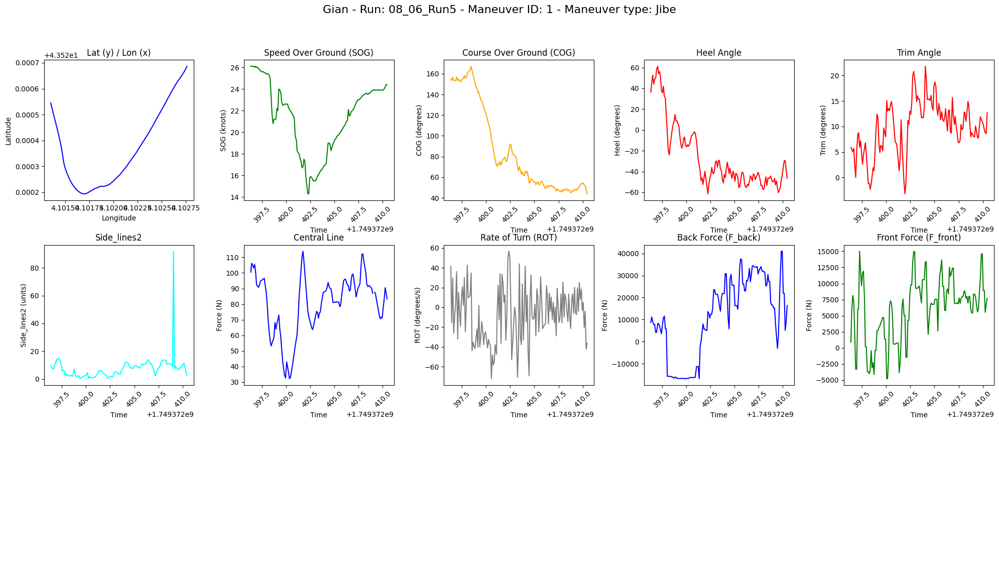


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:49:13.354000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749372553.354
  End Time: 1749372567.354
  boat_name: SenseBoard



avg TWS: 6.75 knots
avg TWA: -43.01 degrees
avg TWD: 301.28 degrees


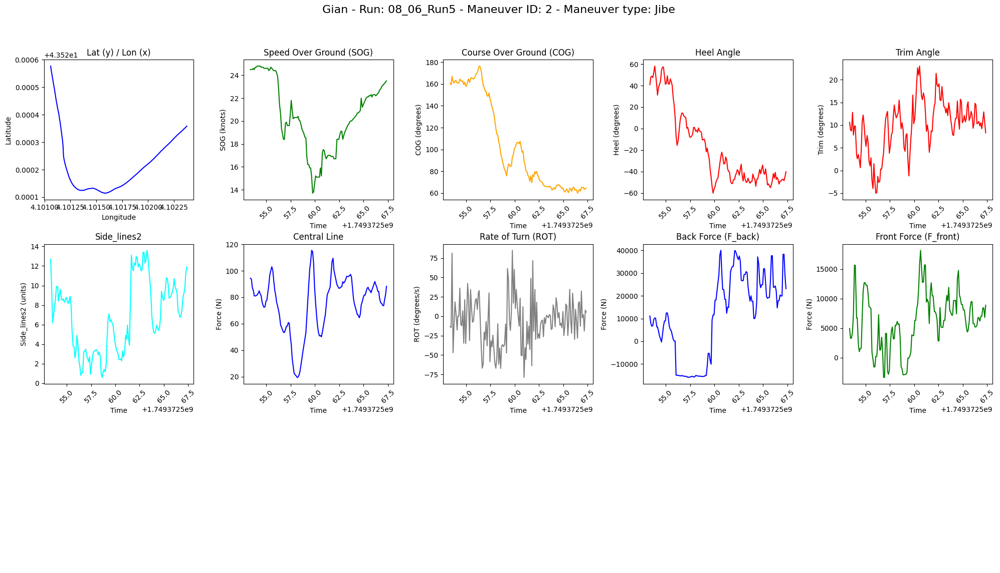


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:49:49.454000+00:00
  Maneuver Type: Jibe
  Duration: 14.098000049591064 seconds
  Start Time: 1749372589.454
  End Time: 1749372603.552
  boat_name: SenseBoard



avg TWS: 5.25 knots
avg TWA: 31.47 degrees
avg TWD: 290.48 degrees


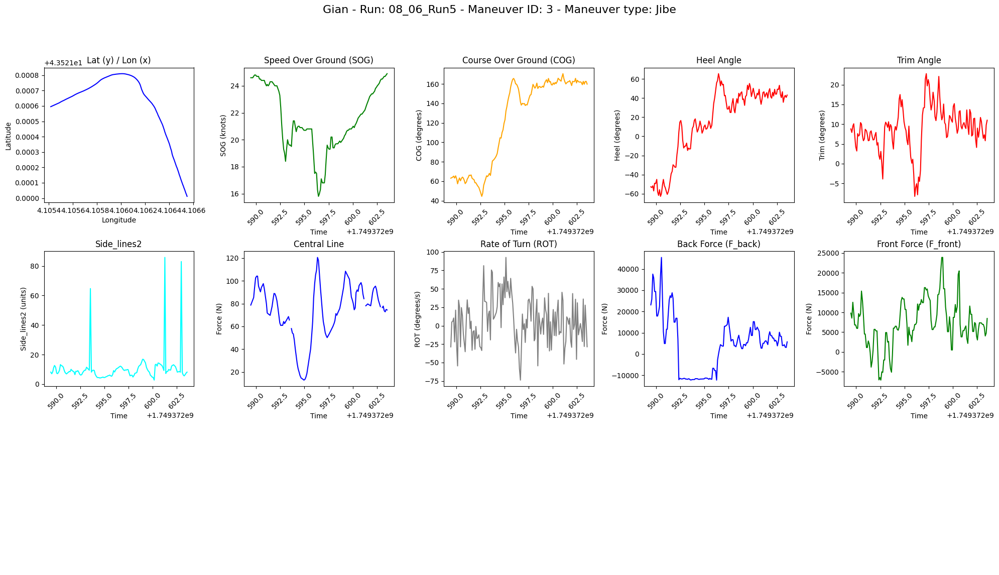

Summary for Gian - Run: 11_06_Run1

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 12:24:36.757000+00:00
  Maneuver Type: Jibe
  Duration: 14.1010000705719 seconds
  Start Time: 1749644676.757
  End Time: 1749644690.858
  boat_name: Gian Stragiotti



avg TWS: 5.64 knots
avg TWA: -60.20 degrees
avg TWD: 192.89 degrees


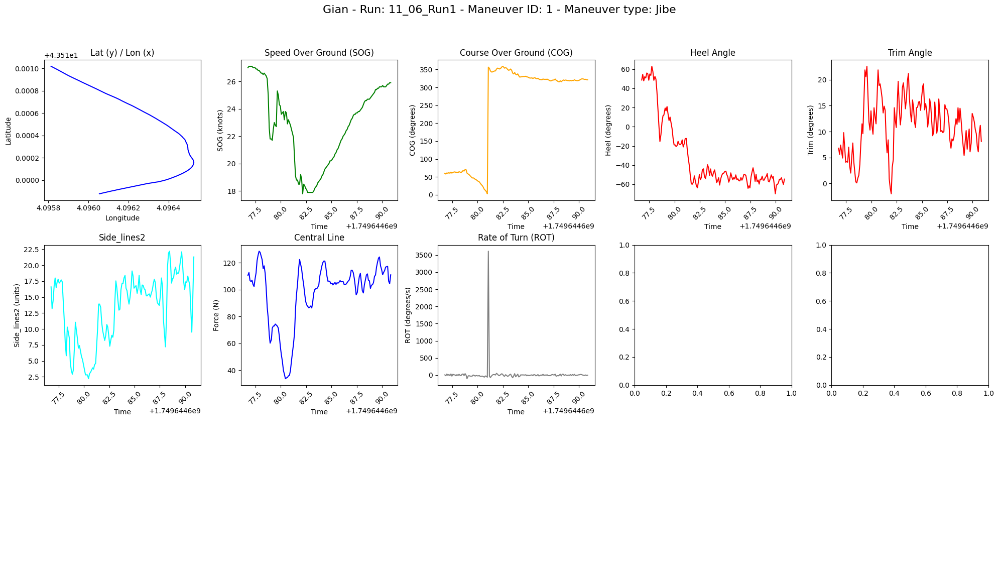


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 12:25:07.160000+00:00
  Maneuver Type: Jibe
  Duration: 13.90499997138977 seconds
  Start Time: 1749644707.16
  End Time: 1749644721.065
  boat_name: Gian Stragiotti



avg TWS: 5.18 knots
avg TWA: 38.16 degrees
avg TWD: 193.03 degrees


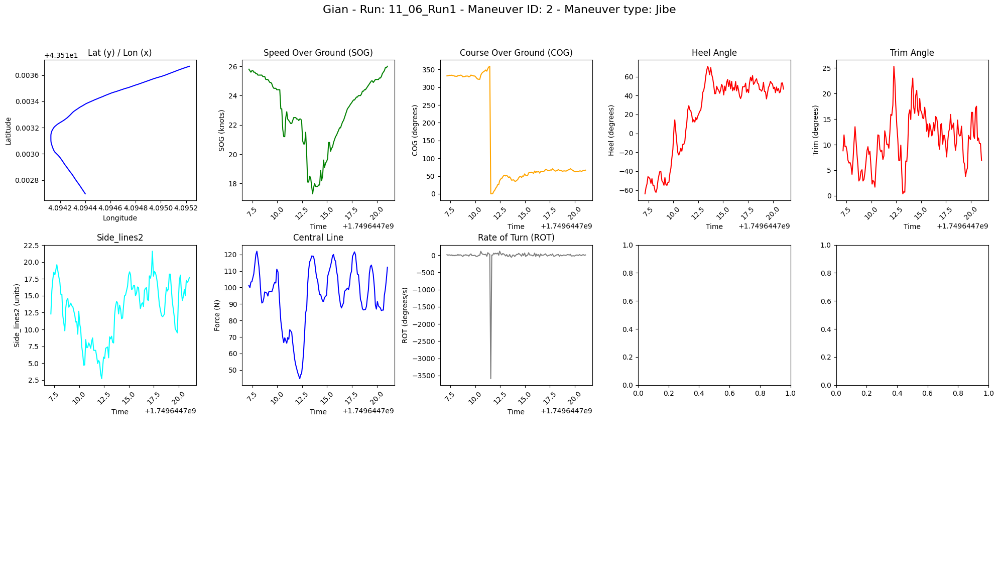


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 12:27:25.456000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749644845.456
  End Time: 1749644859.456
  boat_name: Gian Stragiotti



avg TWS: 5.19 knots
avg TWA: -74.11 degrees
avg TWD: 189.90 degrees


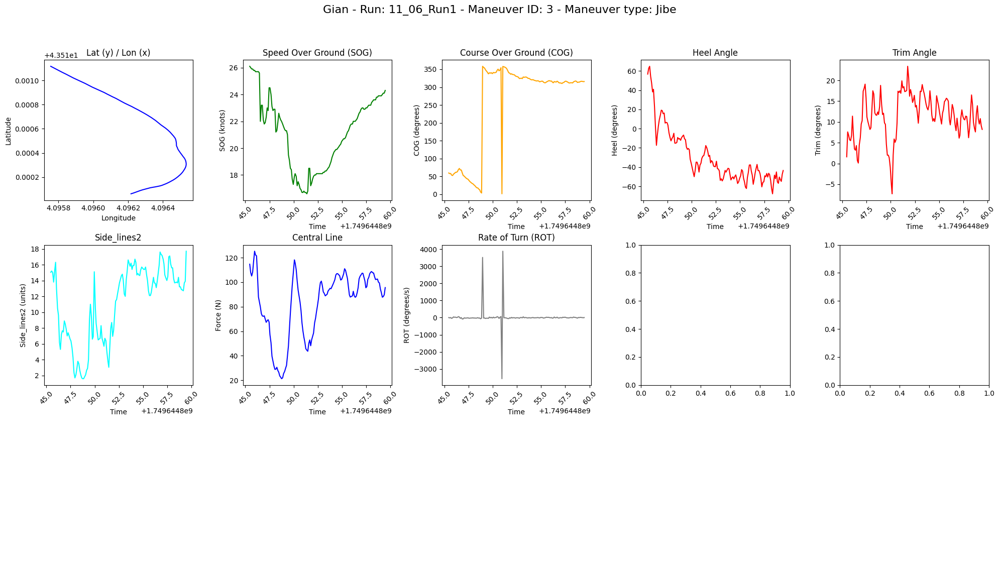


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 12:27:51.657000+00:00
  Maneuver Type: Jibe
  Duration: 13.998999834060667 seconds
  Start Time: 1749644871.657
  End Time: 1749644885.656
  boat_name: Gian Stragiotti



avg TWS: 5.92 knots
avg TWA: 39.20 degrees
avg TWD: 183.89 degrees


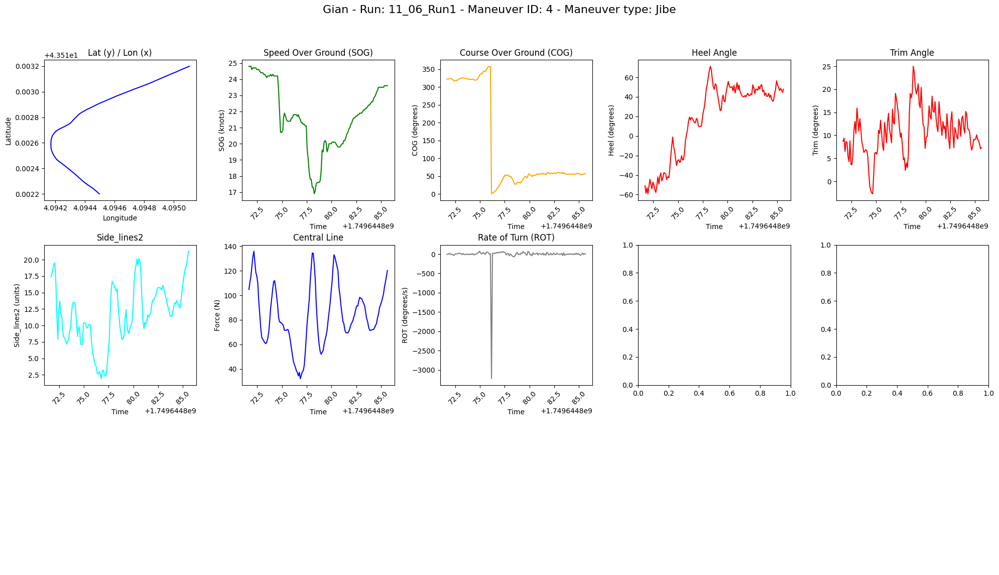

Summary for Gian - Run: 11_06_Run2

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 12:43:23.164000+00:00
  Maneuver Type: Jibe
  Duration: 14.09500002861023 seconds
  Start Time: 1749645803.164
  End Time: 1749645817.259
  boat_name: Gian Stragiotti



avg TWS: 5.03 knots
avg TWA: 79.37 degrees
avg TWD: 179.71 degrees


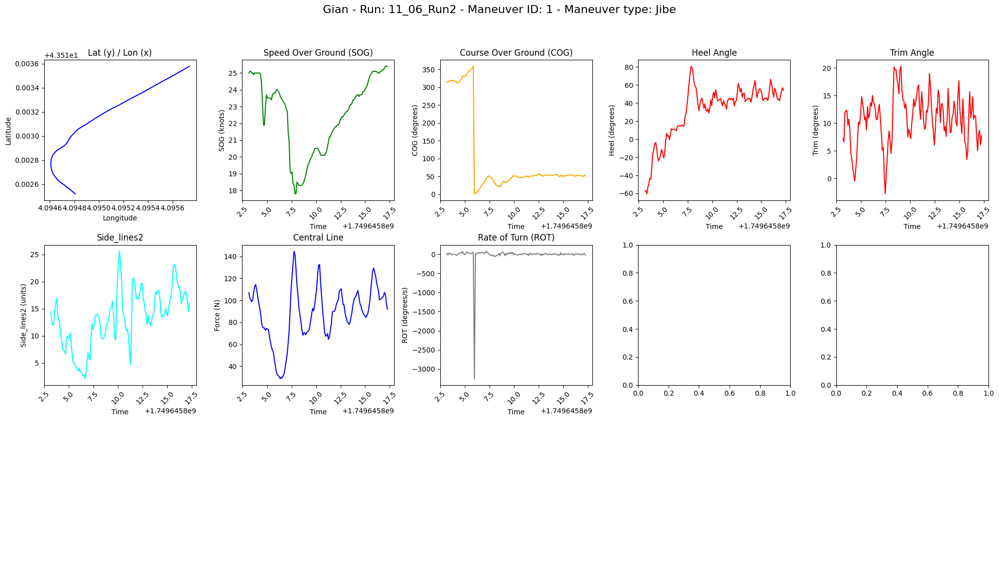


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 12:45:42.262000+00:00
  Maneuver Type: Jibe
  Duration: 13.996999979019163 seconds
  Start Time: 1749645942.262
  End Time: 1749645956.259
  boat_name: Gian Stragiotti



avg TWS: 6.10 knots
avg TWA: -40.96 degrees
avg TWD: 191.85 degrees


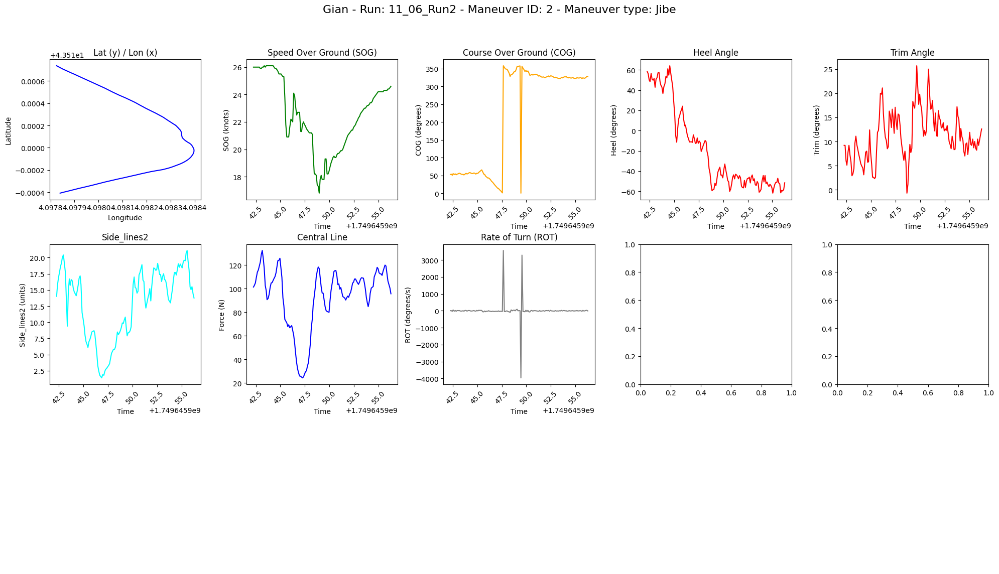

Summary for Gian - Run: 11_06_Run3

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 12:54:16.357000+00:00
  Maneuver Type: Jibe
  Duration: 13.998999834060667 seconds
  Start Time: 1749646456.357
  End Time: 1749646470.356
  boat_name: SenseBoard



avg TWS: 5.74 knots
avg TWA: -69.93 degrees
avg TWD: 195.85 degrees


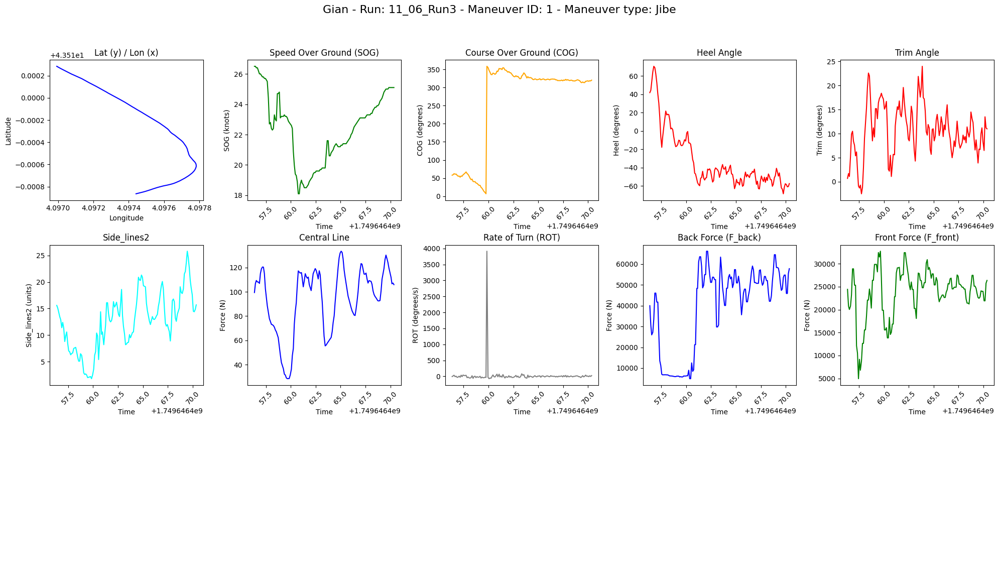


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 12:54:54.157000+00:00
  Maneuver Type: Jibe
  Duration: 14.105000019073486 seconds
  Start Time: 1749646494.157
  End Time: 1749646508.262
  boat_name: SenseBoard



avg TWS: 5.29 knots
avg TWA: 84.87 degrees
avg TWD: 193.23 degrees


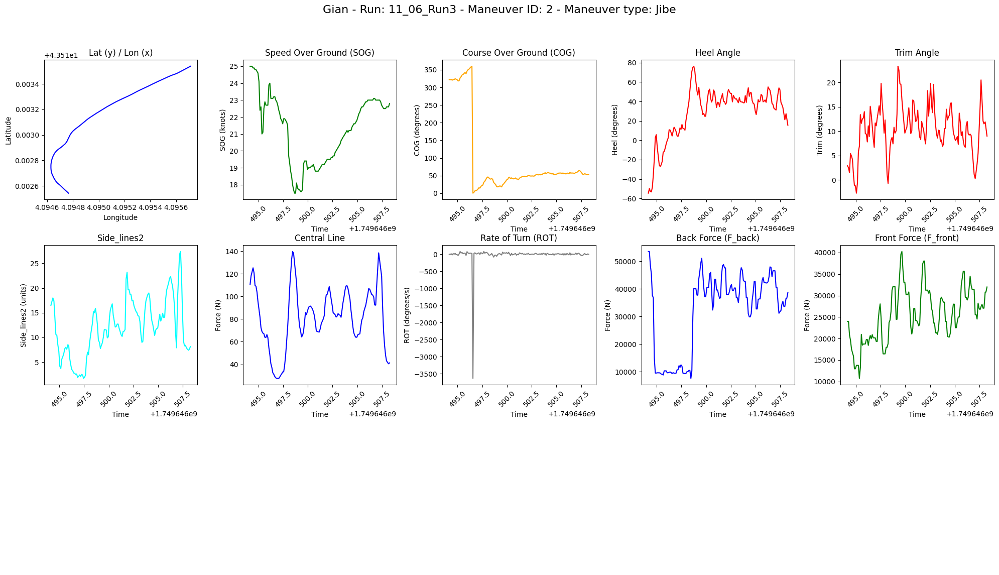


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 12:57:10.556000+00:00
  Maneuver Type: Jibe
  Duration: 14.003999948501589 seconds
  Start Time: 1749646630.556
  End Time: 1749646644.56
  boat_name: SenseBoard



avg TWS: 6.19 knots
avg TWA: -62.09 degrees
avg TWD: 191.42 degrees


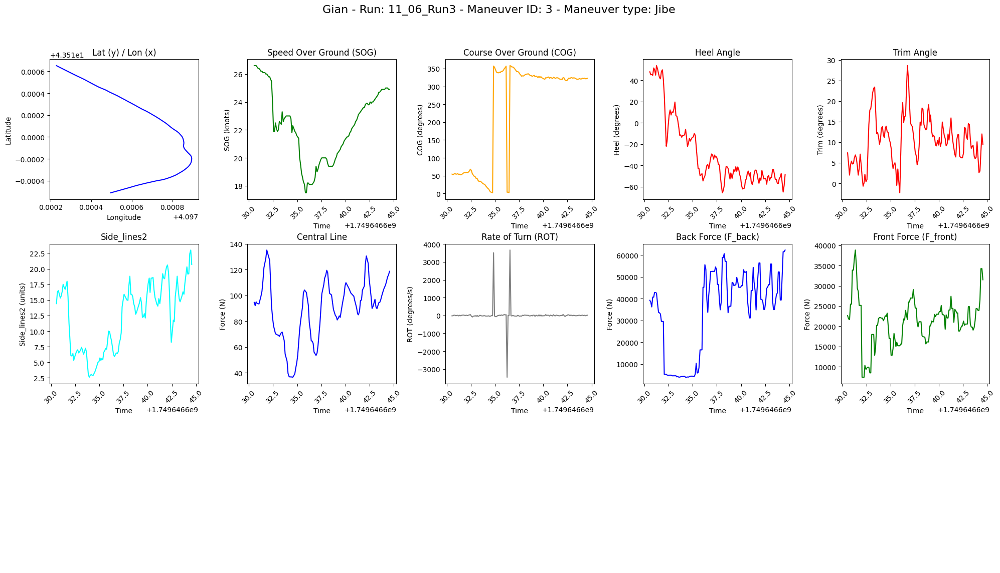


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 12:57:47.078000+00:00
  Maneuver Type: Jibe
  Duration: 13.878000020980837 seconds
  Start Time: 1749646667.078
  End Time: 1749646680.956
  boat_name: SenseBoard



avg TWS: 6.17 knots
avg TWA: 44.47 degrees
avg TWD: 189.77 degrees


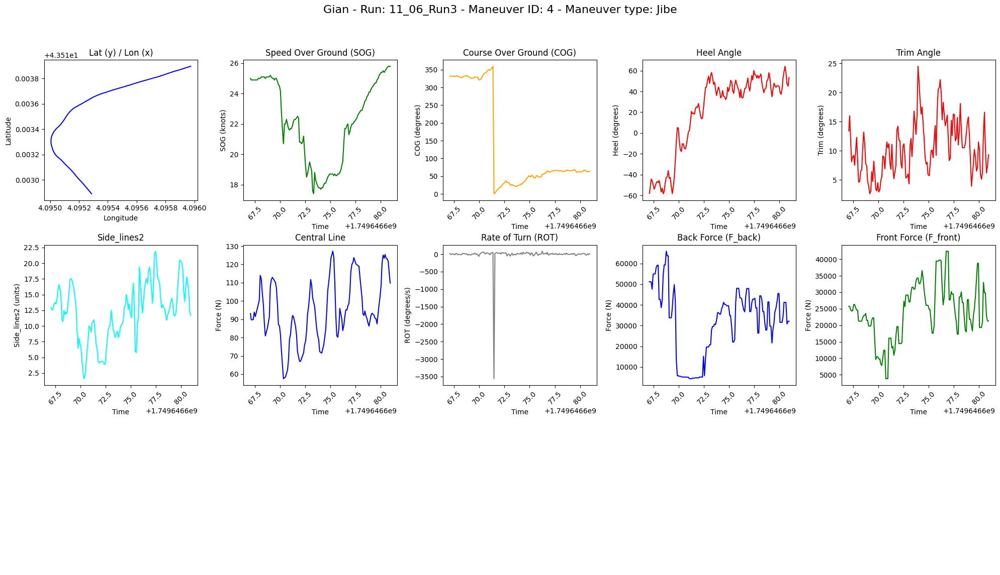

Summary for Gian - Run: 11_06_Run4

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 13:03:53.076000+00:00
  Maneuver Type: Jibe
  Duration: 14.081000089645386 seconds
  Start Time: 1749647033.076
  End Time: 1749647047.157
  boat_name: SenseBoard



avg TWS: 6.88 knots
avg TWA: -52.38 degrees
avg TWD: 183.75 degrees


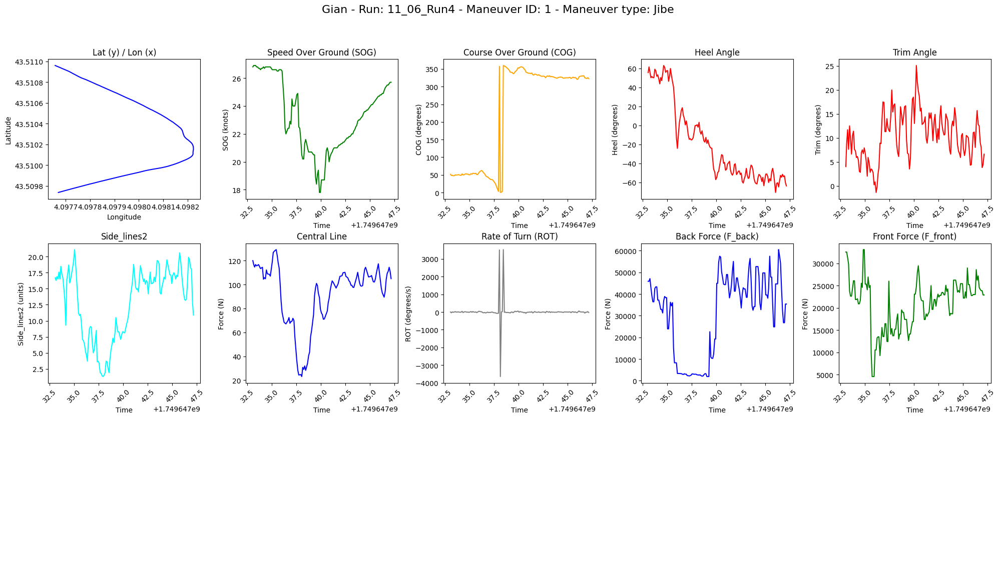


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 13:05:33.358000+00:00
  Maneuver Type: Tack
  Duration: 14.098000049591064 seconds
  Start Time: 1749647133.358
  End Time: 1749647147.456
  boat_name: SenseBoard



avg TWS: 6.16 knots
avg TWA: 24.39 degrees
avg TWD: 197.67 degrees


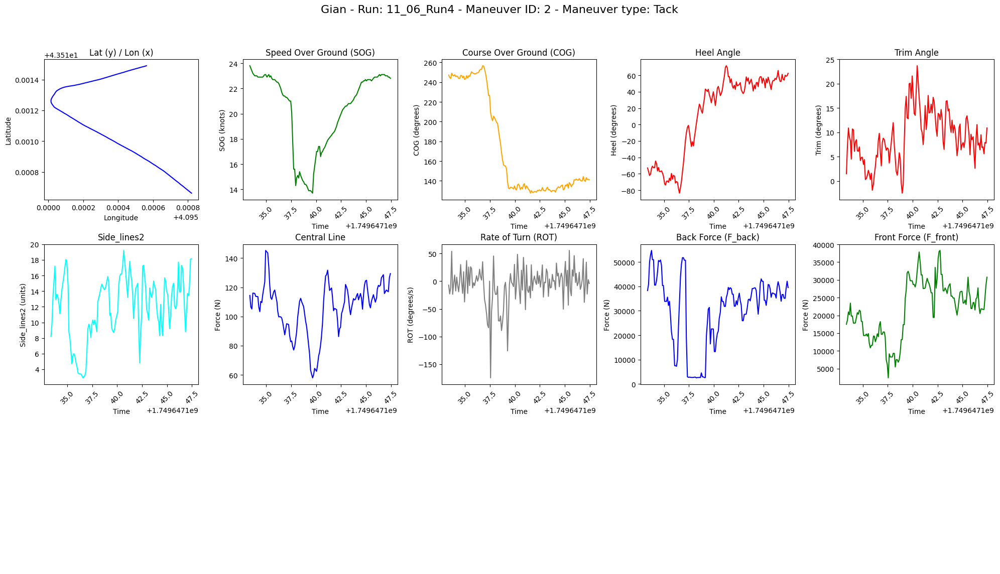


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 13:06:31.260000+00:00
  Maneuver Type: Jibe
  Duration: 14.097000122070312 seconds
  Start Time: 1749647191.26
  End Time: 1749647205.357
  boat_name: SenseBoard



avg TWS: 6.51 knots
avg TWA: -41.31 degrees
avg TWD: 187.51 degrees


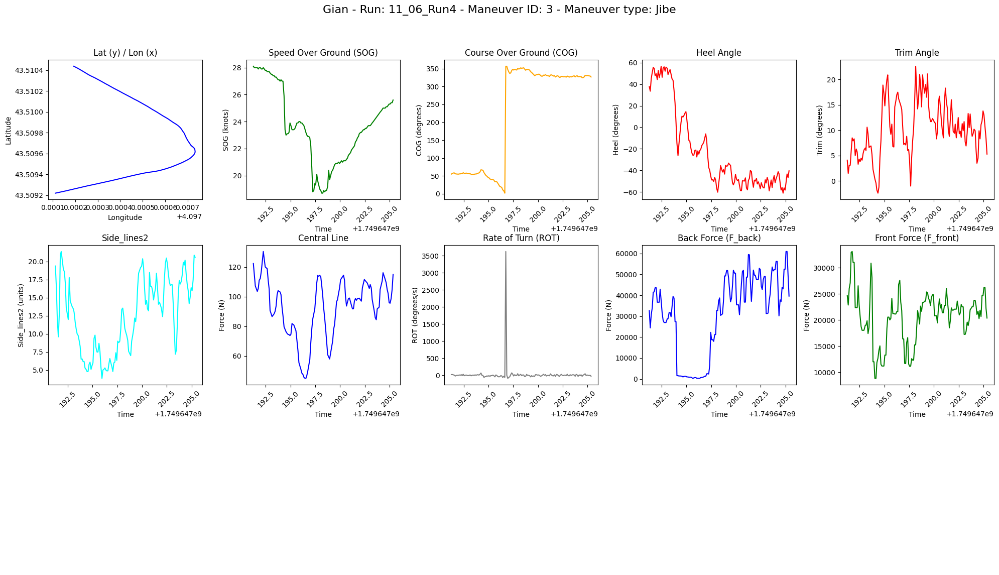


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 13:07:09.062000+00:00
  Maneuver Type: Jibe
  Duration: 14.101999998092651 seconds
  Start Time: 1749647229.062
  End Time: 1749647243.164
  boat_name: SenseBoard



avg TWS: 6.48 knots
avg TWA: 33.44 degrees
avg TWD: 185.49 degrees


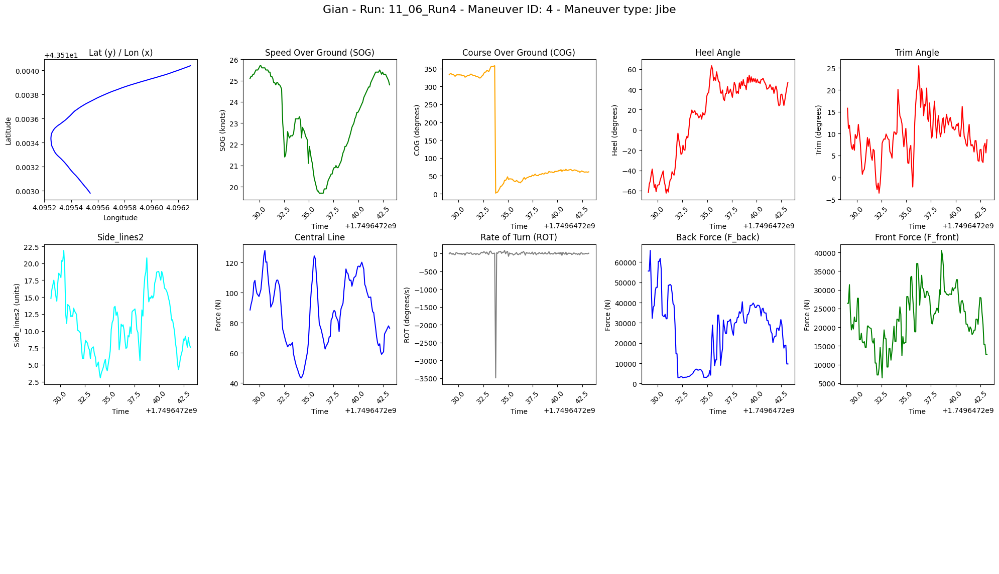


Maneuver details for Maneuver Index: 5
  Maneuver Time: 2025-06-11 13:07:23.657000+00:00
  Maneuver Type: buoy
  Duration: 14.0 seconds
  Start Time: 1749647243.657
  End Time: 1749647257.657
  boat_name: SenseBoard



avg TWS: 6.79 knots
avg TWA: 60.53 degrees
avg TWD: 186.12 degrees


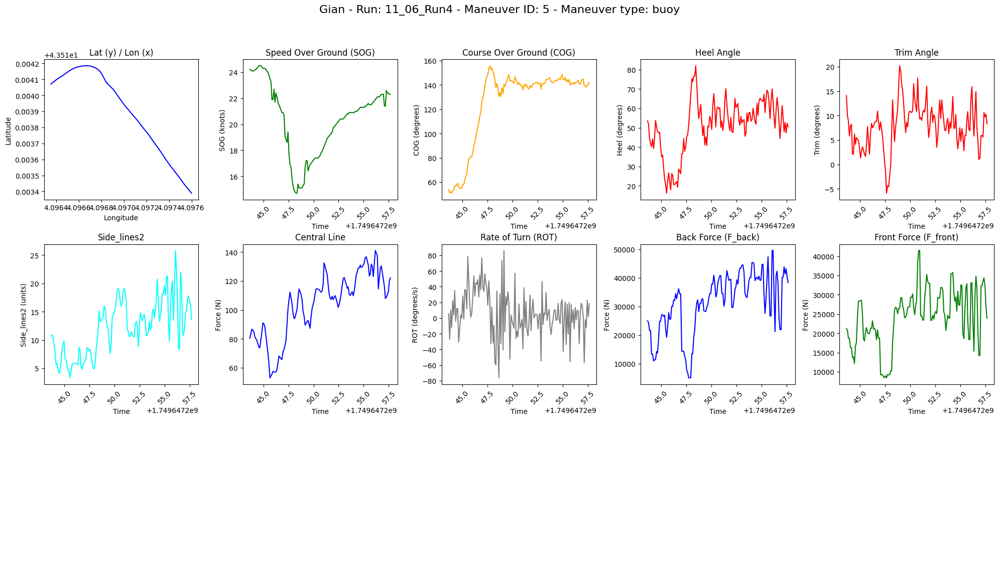

Summary for Gian - Run: 11_06_Run5

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-11 13:13:43.257000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749647623.257
  End Time: 1749647637.257
  boat_name: SenseBoard



avg TWS: 6.27 knots
avg TWA: -73.90 degrees
avg TWD: 183.33 degrees


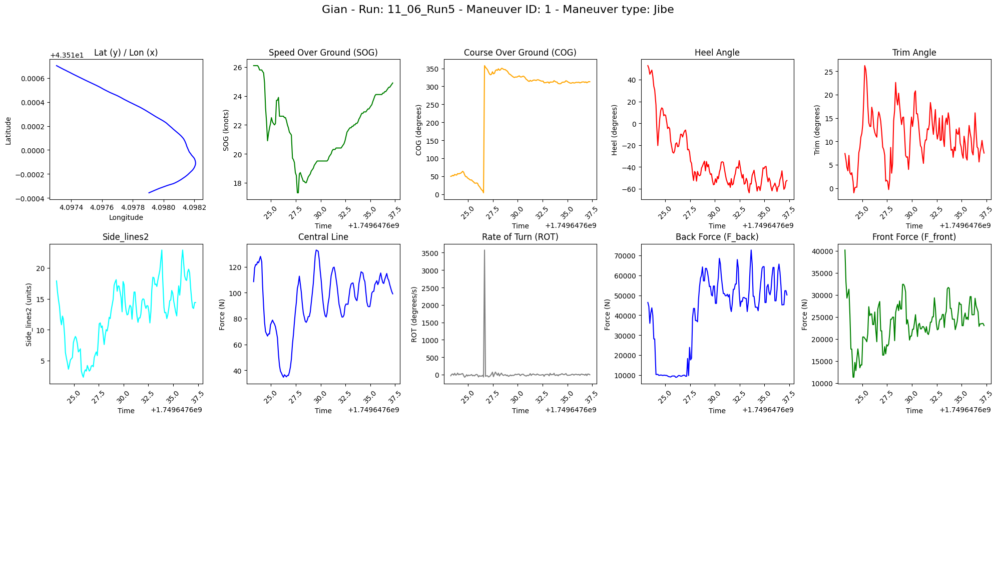


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-11 13:14:17.859000+00:00
  Maneuver Type: Jibe
  Duration: 14.097000122070312 seconds
  Start Time: 1749647657.859
  End Time: 1749647671.956
  boat_name: SenseBoard



avg TWS: 6.03 knots
avg TWA: 40.37 degrees
avg TWD: 180.62 degrees


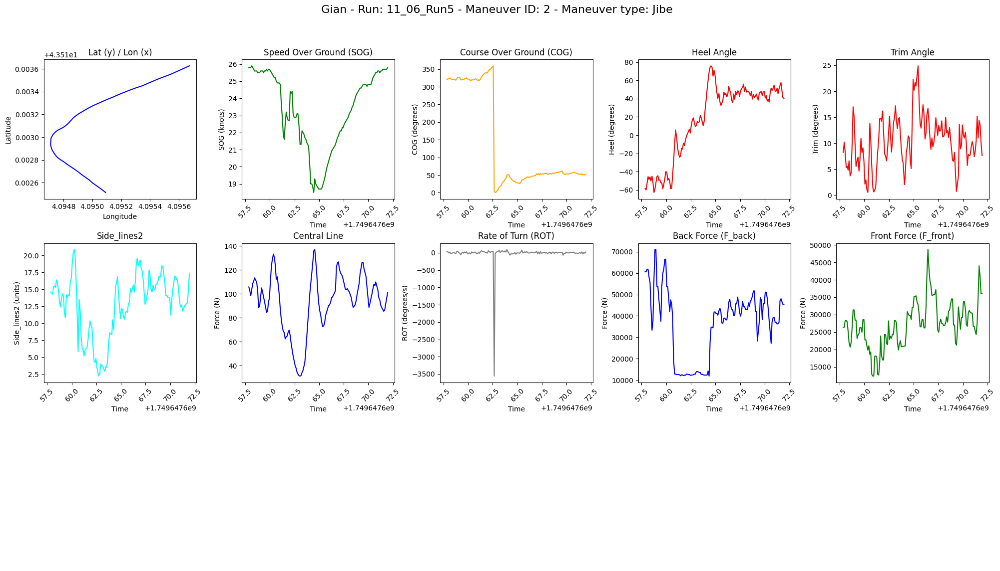


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-11 13:14:36.757000+00:00
  Maneuver Type: buoy
  Duration: 14.1010000705719 seconds
  Start Time: 1749647676.757
  End Time: 1749647690.858
  boat_name: SenseBoard



avg TWS: 6.21 knots
avg TWA: 71.12 degrees
avg TWD: 183.10 degrees


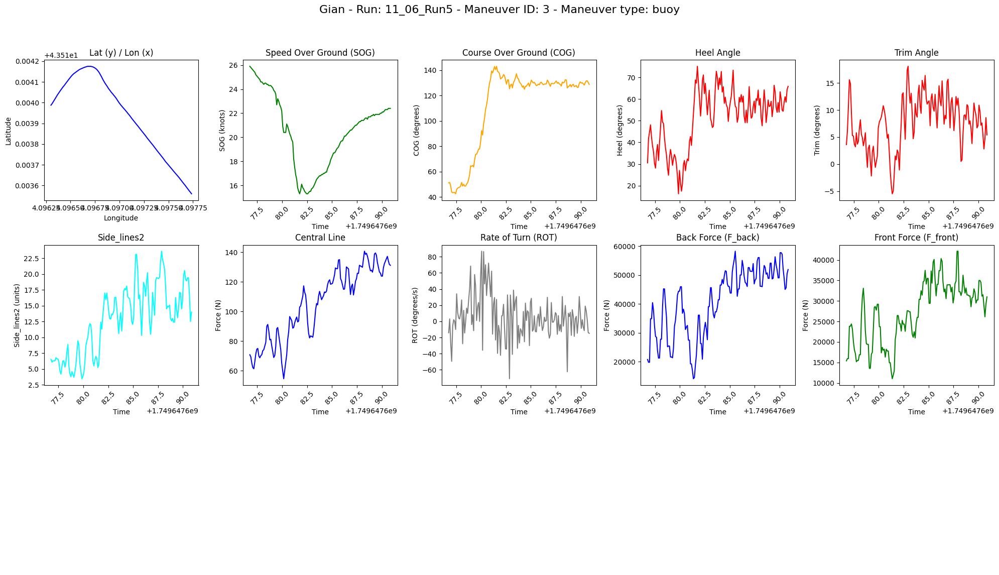


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-11 13:16:30.956000+00:00
  Maneuver Type: Jibe
  Duration: 14.000999927520752 seconds
  Start Time: 1749647790.956
  End Time: 1749647804.957
  boat_name: SenseBoard



avg TWS: 5.26 knots
avg TWA: -33.11 degrees
avg TWD: 196.14 degrees


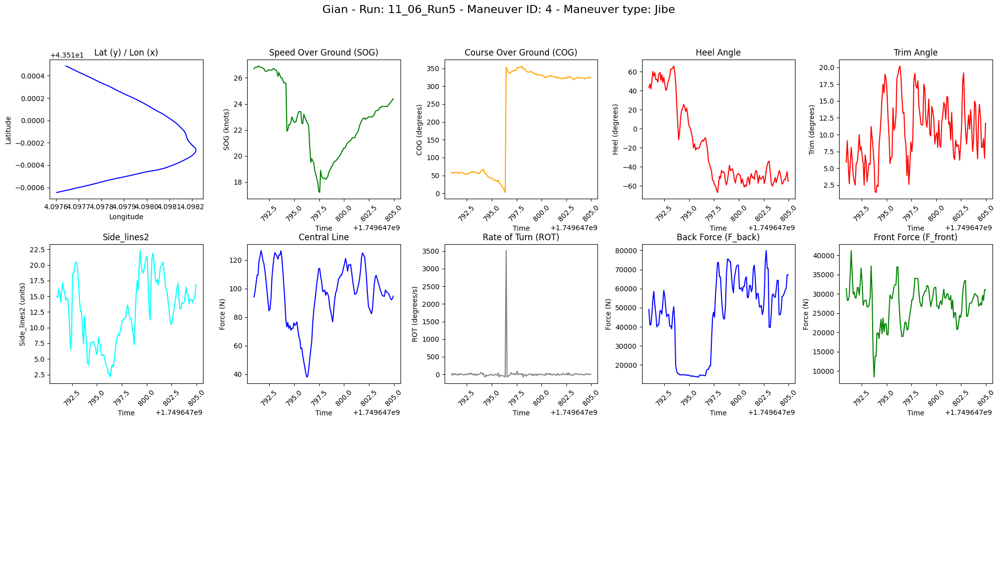

In [3]:
plot(df,'Gian')